In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import tifffile
import pickle
import glob
from copy import deepcopy
from scipy.sparse import csr_matrix
import matplotlib
import matplotlib.patches as mpatches
import anndata as ad
from scipy.io import mmread
import torch
import time
import seaborn as sns
from sklearn.metrics import adjusted_rand_score
import random
import os
import sys

## Loading merfish data, quality control and normalization

### Preprocess data

In [9]:
# Read data
loc = '/mnt/data/human_tumor/lung/patient1'
# loc = '/mnt/uydnguye/test_data'
# sp_adata = ad.read(f'{loc}/merfish_data.h5ad')
sp_adata = ad.read(f'/mnt/uydnguye/data/human_lung/merfish_data.h5ad')

# Remove blank
sp_adata = sp_adata[:, [gene for gene in sp_adata.var.index if 'Blank' not in gene]]

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [10]:
sp_adata

View of AnnData object with n_obs × n_vars = 353762 × 500
    obs: 'fov', 'volume', 'x', 'y'
    var: 'gene'

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_qc.py:422: RuntimeWarning: invalid value encountered in true_divide
  return values / sums[:, None]
/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


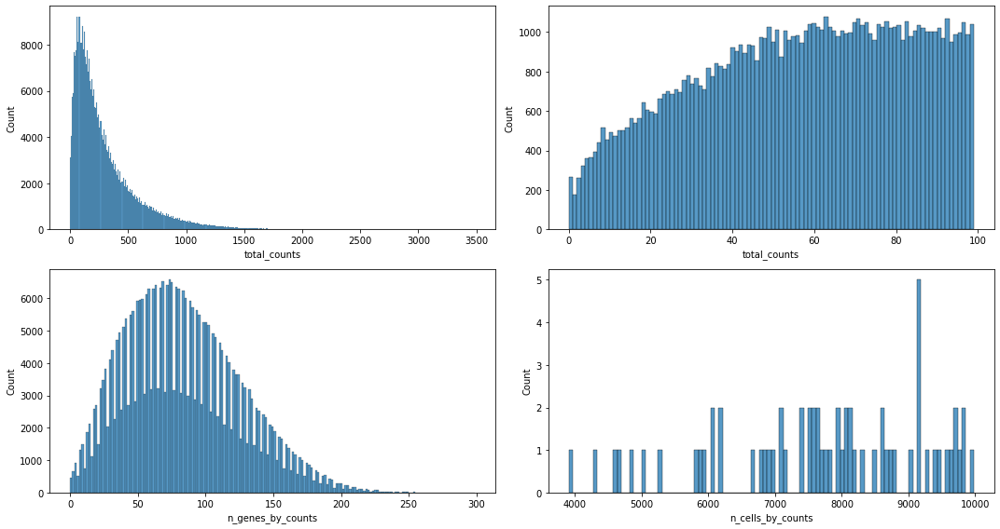

In [11]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(sp_adata, inplace=True)

# Plot metrics
# Use these to pick the values for filtering
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
sns.histplot(sp_adata.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sp_adata.obs["total_counts"][sp_adata.obs["total_counts"] < 100], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sp_adata.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sp_adata.var["n_cells_by_counts"][sp_adata.var["n_cells_by_counts"] < 10000], kde=False, bins=100, ax=axs[1,1])
fig.tight_layout()


In [12]:
# Filter data
sc.pp.filter_cells(sp_adata, min_counts=40)
sc.pp.filter_cells(sp_adata, max_counts=1500)
sc.pp.filter_cells(sp_adata, min_genes=10)
print(f"#cells after count filter: {sp_adata.n_obs}")

sc.pp.filter_genes(sp_adata, min_cells=1000)
print(f"#genes after minimum cells per gene filter: {sp_adata.n_vars}")

#cells after count filter: 328127
#genes after minimum cells per gene filter: 500


In [7]:
# Normalize
sc.pp.normalize_total(sp_adata, inplace = True, exclude_highly_expressed=True)

# Z scale
sc.pp.scale(sp_adata)

# Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression 
# for later use
sp_adata.raw = sp_adata


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [13]:
# Normalize
sc.pp.normalize_total(sp_adata, inplace = True, exclude_highly_expressed=True)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


## Process scRNAseq data

In [7]:
loc = '/mnt/uydnguye/test_data'
sc_adata = ad.read(f'{loc}/single_cell_HLCA_GSE136831/raw_data_control.h5ad')

In [8]:
Counter(list(sc_adata.obs['celltype_major']))

Counter({'Myeloid': 73765,
         'Lymphoid': 13403,
         'Endothelial': 2184,
         'Stromal': 1144,
         'Epithelial': 4788})

In [9]:
for major_type in sorted(set(sc_adata.obs['celltype_major'])):
    print(major_type)
    print(Counter(sc_adata[sc_adata.obs['celltype_major'] == major_type].obs['celltype_minor_lv1']))

Endothelial
Counter({'Lymphatic': 973, 'VE_Capillary_B': 436, 'VE_Arterial': 274, 'VE_Venous': 226, 'VE_Capillary_A': 192, 'VE_Peribronchial': 83})
Epithelial
Counter({'ATII': 2655, 'Ciliated': 1144, 'ATI': 502, 'Club': 226, 'Basal': 114, 'Goblet': 101, 'Mesothelial': 46})
Lymphoid
Counter({'T': 4410, 'T_Cytotoxic': 4061, 'NK': 2744, 'B': 1227, 'T_Regulatory': 316, 'ILC_A': 276, 'B_Plasma': 232, 'ILC_B': 137})
Myeloid
Counter({'Macrophage': 40747, 'Macrophage_Alveolar': 23905, 'cMonocyte': 6106, 'cDC2': 1364, 'ncMonocyte': 1058, 'cDC1': 199, 'Mast': 165, 'DC_Mature': 151, 'pDC': 52, 'DC_Langerhans': 18})
Stromal
Counter({'Fibroblast': 847, 'Myofibroblast': 204, 'SMC': 69, 'Pericyte': 24})


In [10]:
# Drop pseudogenes
sc_adata = sc_adata[:, [gene[:4] != 'ENSG' for gene in sc_adata.var.index]]

In [11]:
sc_adata

View of AnnData object with n_obs × n_vars = 95284 × 30503
    obs: 'celltype_major', 'celltype_minor_lv1', 'celltype_minor_lv2', 'patient', 'disease'
    var: 'gene'

In [12]:
# Rename types
name_map = {'Lymphatic': 'Lymphatic cells',
            'VE_Arterial': 'Vascular endothelial arterial',
            'VE_Capillary_A': 'Vascular endothelial capillary A',
            'VE_Capillary_B': 'Vascular endothelial capillary B',
            'VE_Peribronchial': 'Vascular endothelial peribronchial',
            'VE_Venous': 'Vascular endothelial venous',
            'ATI': 'Alveolar epithelial type I',
            'ATII': 'Alveolar epithelial type II',
            'B': 'B cells',
            'B_Plasma': 'Plasma B cells',
            'ILC_A': 'Innate lymphoid cells A',
            'ILC_B': 'Innate lymphoid cells B',
            'NK': 'Natural killer cells',
            'T': 'T cells',
            'T_Cytotoxic': 'Cytotoxic T cells',
            'T_Regulatory': 'Regulatory T cells',
            'Macrophage_Alveolar': 'Alveolar macrophage cells',
            'cMonocyte': 'Classical monocyte',
            'ncMonocyte': 'Nonclassical monocyte',
            'DC_Langerhans': 'Langerhans dendritic cells',
            'DC_Mature': 'Mature dendritic cells',
            'cDC1': 'Conventional type 1 dendritic cells',
            'cDC2': 'Conventional type 2 dendritic cells',
            'pDC': 'Plasmacytoid dendritic cells',
            'SMC': 'Smooth muscle cells'
            }

sc_adata.obs['celltype_minor_lv1'] = [name_map[cell_type] if cell_type in name_map else cell_type for cell_type in sc_adata.obs['celltype_minor_lv1']]


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:29: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [13]:
for major_type in sorted(set(sc_adata.obs['celltype_major'])):
    print(major_type)
    print(Counter(sc_adata[sc_adata.obs['celltype_major'] == major_type].obs['celltype_minor_lv1']))

Endothelial
Counter({'Lymphatic cells': 973, 'Vascular endothelial capillary B': 436, 'Vascular endothelial arterial': 274, 'Vascular endothelial venous': 226, 'Vascular endothelial capillary A': 192, 'Vascular endothelial peribronchial': 83})
Epithelial
Counter({'Alveolar epithelial type II': 2655, 'Ciliated': 1144, 'Alveolar epithelial type I': 502, 'Club': 226, 'Basal': 114, 'Goblet': 101, 'Mesothelial': 46})
Lymphoid
Counter({'T cells': 4410, 'Cytotoxic T cells': 4061, 'Natural killer cells': 2744, 'B cells': 1227, 'Regulatory T cells': 316, 'Innate lymphoid cells A': 276, 'Plasma B cells': 232, 'Innate lymphoid cells B': 137})
Myeloid
Counter({'Macrophage': 40747, 'Alveolar macrophage cells': 23905, 'Classical monocyte': 6106, 'Conventional type 2 dendritic cells': 1364, 'Nonclassical monocyte': 1058, 'Conventional type 1 dendritic cells': 199, 'Mast': 165, 'Mature dendritic cells': 151, 'Plasmacytoid dendritic cells': 52, 'Langerhans dendritic cells': 18})
Stromal
Counter({'Fibro

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


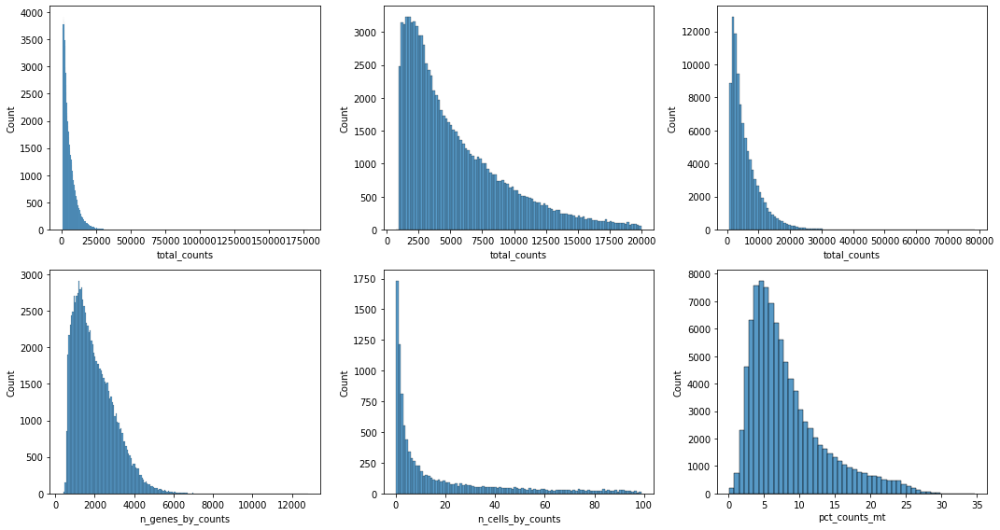

In [14]:
# Calculate QC metrics
sc_adata.var['mt'] = sc_adata.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata.obs["total_counts"][sc_adata.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata.obs["total_counts"][sc_adata.obs["total_counts"] < 80000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata.var["n_cells_by_counts"][sc_adata.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [15]:
# Filter data
sc.pp.filter_cells(sc_adata, min_counts=1000)
sc.pp.filter_cells(sc_adata, max_counts=30000)
sc.pp.filter_cells(sc_adata, min_genes=500)
sc_adata = sc_adata[sc_adata.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata.n_obs}")

sc.pp.filter_genes(sc_adata, min_cells=20)
print(f"#genes after minimum cells per gene filter: {sc_adata.n_vars}")

#cells after count filter: 94098


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


#genes after minimum cells per gene filter: 23046


In [16]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata)

# Z scale
# sc.pp.scale(sc_adata)

In [17]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata = sc_adata[:, np.isin(sc_adata.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata, 'celltype_major', method='wilcoxon')
cell_types = sc_adata.uns['rank_genes_groups']['names'].dtype.names

markers = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers[cell_types[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [18]:
for cell_type in cell_types:
    print(cell_type)
    print(markers[cell_type])

Endothelial
['CLDN5', 'WWTR1', 'CAV1', 'PECAM1', 'ZEB1', 'PTK2', 'MMRN1', 'VWF', 'ITGA1', 'CDH5', 'TGFBR2', 'TGFBR3', 'COL4A1', 'FLI1', 'TEK', 'TNFSF10', 'TEAD1', 'PREX2', 'AKT3', 'IGF1R', 'TGM2', 'CLEC14A', 'NEDD4', 'ETS1', 'PROX1', 'YAP1', 'PDPN', 'TEAD4', 'KDR', 'GPX3']
Epithelial
['CDH1', 'TEAD1', 'YAP1', 'PTK2', 'WWTR1', 'EPCAM', 'LAMP3', 'ROS1', 'EGFR', 'EGR1', 'MET', 'IGF1R', 'LAMB3', 'EPHA2', 'FGFR2', 'BCL2L1', 'JUN', 'STAT3', 'PRKCA', 'MUC4', 'ROR1', 'ERBB3', 'CAV1', 'BMP1', 'EPHA4', 'TGFBR2', 'LAMC2', 'CXCL2', 'LRP5', 'LRP6']
Lymphoid
['CXCR4', 'ITK', 'STAT4', 'PTPRC', 'CCL5', 'CCL4', 'ETS1', 'GZMB', 'CD3D', 'CD2', 'PRF1', 'NKG7', 'GNLY', 'ZEB1', 'KLRB1', 'GZMA', 'CTSW', 'CD3E', 'CASP8', 'TRAC', 'BCL2', 'TRBC1', 'ITGA4', 'TGFBR3', 'IL12RB2', 'AKT3', 'CD3G', 'GZMH', 'CD226', 'TGFB1']
Myeloid
['HLA-DRA', 'HLA-DRB1', 'MSR1', 'MRC1', 'MARCO', 'CEBPB', 'S100A9', 'HLA-DPB1', 'CSF2RA', 'ITGAX', 'C1QC', 'HLA-DPA1', 'MAP2K1', 'CTNNB1', 'SERPINA1', 'CD86', 'HIF1A', 'CXCL16', 'IFNGR2', 

## Subset single cell data based on major cell types

In [19]:
loc = '/mnt/uydnguye/data/human_lung'
sc_adata = ad.read(f'{loc}/single_cell_HLCA_GSE136831/raw_data_control.h5ad')

In [20]:
# Drop pseudogenes
sc_adata = sc_adata[:, [gene[:4] != 'ENSG' for gene in sc_adata.var.index]]

In [21]:
sc_adata

View of AnnData object with n_obs × n_vars = 95284 × 30503
    obs: 'celltype_major', 'celltype_minor_lv1', 'celltype_minor_lv2', 'patient', 'disease'
    var: 'gene'

In [22]:
# Rename types
name_map = {'Lymphatic': 'Lymphatic cells',
            'VE_Arterial': 'Vascular endothelial arterial',
            'VE_Capillary_A': 'Vascular endothelial capillary A',
            'VE_Capillary_B': 'Vascular endothelial capillary B',
            'VE_Peribronchial': 'Vascular endothelial peribronchial',
            'VE_Venous': 'Vascular endothelial venous',
            'ATI': 'Alveolar epithelial type I',
            'ATII': 'Alveolar epithelial type II',
            'B': 'B cells',
            'B_Plasma': 'Plasma B cells',
            'ILC_A': 'Innate lymphoid cells A',
            'ILC_B': 'Innate lymphoid cells B',
            'NK': 'Natural killer cells',
            'T': 'T cells',
            'T_Cytotoxic': 'Cytotoxic T cells',
            'T_Regulatory': 'Regulatory T cells',
            'Macrophage_Alveolar': 'Alveolar macrophage cells',
            'cMonocyte': 'Classical monocyte',
            'ncMonocyte': 'Nonclassical monocyte',
            'DC_Langerhans': 'Langerhans dendritic cells',
            'DC_Mature': 'Mature dendritic cells',
            'cDC1': 'Conventional type 1 dendritic cells',
            'cDC2': 'Conventional type 2 dendritic cells',
            'pDC': 'Plasmacytoid dendritic cells',
            'SMC': 'Smooth muscle cells'
            }

sc_adata.obs['celltype_minor_lv1'] = [name_map[cell_type] if cell_type in name_map else cell_type for cell_type in sc_adata.obs['celltype_minor_lv1']]

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:29: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [23]:
sc_adata_1 = sc_adata[np.isin(sc_adata.obs['celltype_major'], ['Endothelial'])]
sc_adata_2 = sc_adata[np.isin(sc_adata.obs['celltype_major'], ['Epithelial'])]
sc_adata_3 = sc_adata[np.isin(sc_adata.obs['celltype_major'], ['Lymphoid'])]
sc_adata_4 = sc_adata[np.isin(sc_adata.obs['celltype_major'], ['Myeloid'])]
sc_adata_5 = sc_adata[np.isin(sc_adata.obs['celltype_major'], ['Stromal'])]

Subset 1 - Endothelial

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


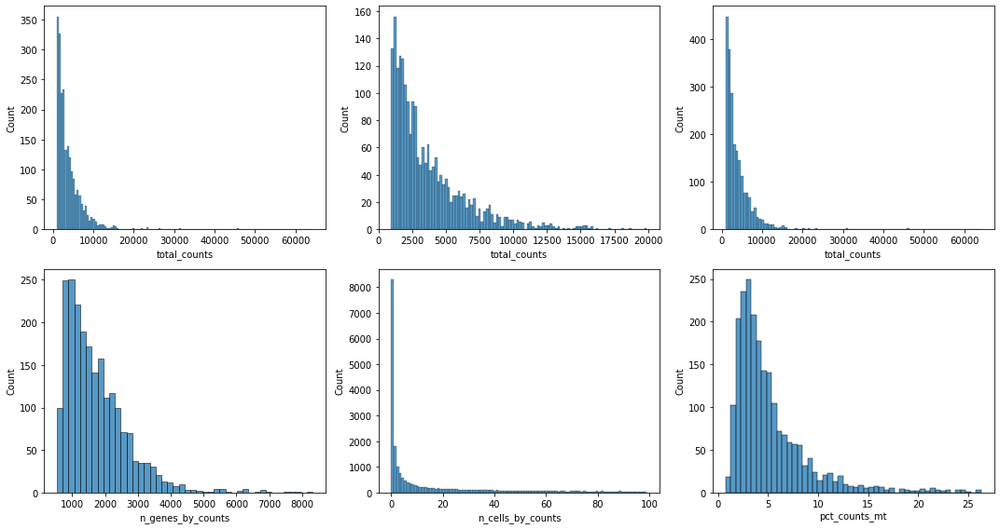

In [24]:
# Calculate QC metrics
sc_adata_1.var['mt'] = sc_adata_1.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata_1, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata_1.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata_1.obs["total_counts"][sc_adata_1.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata_1.obs["total_counts"][sc_adata_1.obs["total_counts"] < 80000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata_1.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata_1.var["n_cells_by_counts"][sc_adata_1.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata_1.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [25]:
# Filter data
sc.pp.filter_cells(sc_adata_1, min_counts=1000)
sc.pp.filter_cells(sc_adata_1, max_counts=20000)
sc.pp.filter_cells(sc_adata_1, min_genes=500)
sc_adata_1 = sc_adata_1[sc_adata_1.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata_1.n_obs}")

sc.pp.filter_genes(sc_adata_1, min_cells=15)
print(f"#genes after minimum cells per gene filter: {sc_adata_1.n_vars}")

#cells after count filter: 2121
#genes after minimum cells per gene filter: 14879


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [26]:
Counter(list(sc_adata_1.obs['celltype_minor_lv1']))

Counter({'Lymphatic cells': 965,
         'Vascular endothelial venous': 223,
         'Vascular endothelial capillary A': 183,
         'Vascular endothelial arterial': 256,
         'Vascular endothelial capillary B': 420,
         'Vascular endothelial peribronchial': 74})

In [27]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata_1, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata_1)

# Z scale
# sc.pp.scale(sc_adata_1)

In [28]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata_1 = sc_adata_1[:, np.isin(sc_adata_1.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata_1, 'celltype_minor_lv1', method='wilcoxon')
cell_types_1 = sc_adata_1.uns['rank_genes_groups']['names'].dtype.names

markers_1 = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata_1.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata_1.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers_1[cell_types_1[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [29]:
for cell_type in cell_types_1:
    print(cell_type)
    print(markers_1[cell_type])

Lymphatic cells
['MMRN1', 'PROX1', 'PDPN', 'MRC1', 'FLT4', 'TGFBR2', 'PDGFC', 'FN1', 'TGFB2', 'LMNA', 'PRKCA', 'THBD', 'LRP5', 'IGF1', 'ACKR3', 'ELN', 'TMEM59', 'LOX', 'CDK6', 'KDR', 'MYC', 'ANGPT2', 'CCND1', 'PDGFA', 'PKM', 'XBP1', 'INSR', 'YAP1', 'TGFB3', 'CTNNB1']
Vascular endothelial arterial
['CLEC14A', 'GPX3', 'VWF', 'CXCL2', 'BST2', 'PREX2', 'SOCS3', 'IL6', 'CXCL12', 'ENG', 'HIF1A', 'TEAD1', 'EGR1', 'JUNB', 'CSF3', 'FLT1', 'NFKBIA', 'PECAM1', 'CXCL1', 'VCAM1', 'PTGS2', 'MMRN2', 'HLA-DRB1', 'IL3RA', 'HLA-B', 'TNFSF10', 'FOS', 'DUSP1', 'EPHA4', 'PTK2']
Vascular endothelial capillary A
['HLA-C', 'CLDN5', 'ITGA1', 'TGFBR3', 'HLA-B', 'PECAM1', 'SERPINE1', 'FLT1', 'NRP1', 'IFNGR1', 'GPX3', 'HLA-DRB1', 'TBX3', 'HLA-DRA', 'BST2', 'ZEB1', 'CDH5', 'AKT3', 'TNFSF10']
Vascular endothelial capillary B
['PECAM1', 'VWF', 'HLA-C', 'IFNGR1', 'ITGA1', 'HLA-B', 'ENG', 'WWTR1', 'GPX3', 'FLT1', 'TEK', 'TNFSF10', 'PDK4', 'NRP1', 'CLEC14A', 'CDH5', 'COL4A1', 'TBX3', 'HLA-DRB1', 'AKT3', 'BST2', 'ZEB1',

Subset 2 - Epithelial

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


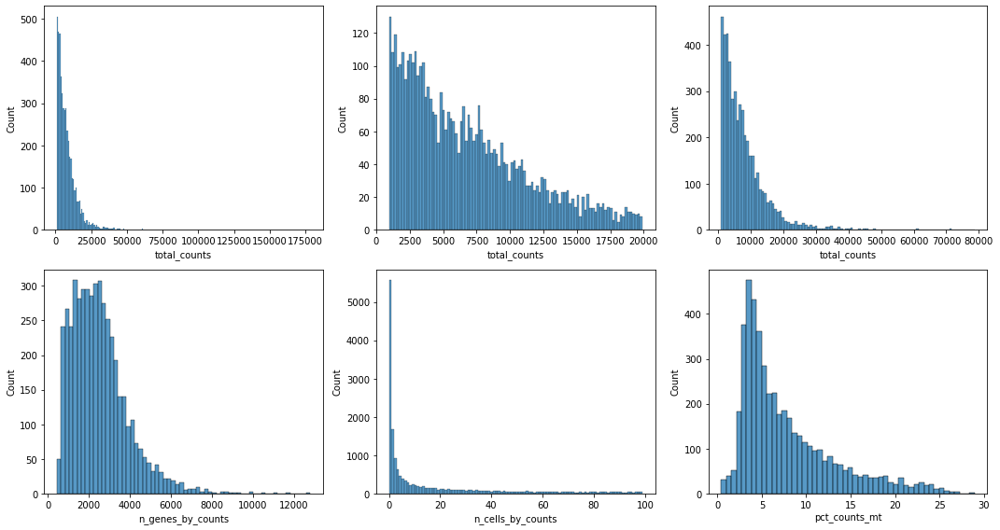

In [30]:
# Calculate QC metrics
sc_adata_2.var['mt'] = sc_adata_2.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata_2, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata_2.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata_2.obs["total_counts"][sc_adata_2.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata_2.obs["total_counts"][sc_adata_2.obs["total_counts"] < 80000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata_2.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata_2.var["n_cells_by_counts"][sc_adata_2.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata_2.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [31]:
# Filter data
sc.pp.filter_cells(sc_adata_2, min_counts=1000)
sc.pp.filter_cells(sc_adata_2, max_counts=40000)
sc.pp.filter_cells(sc_adata_2, min_genes=500)
sc_adata_2 = sc_adata_2[sc_adata_2.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata_2.n_obs}")

sc.pp.filter_genes(sc_adata_2, min_cells=20)
print(f"#genes after minimum cells per gene filter: {sc_adata_2.n_vars}")

#cells after count filter: 4707


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


#genes after minimum cells per gene filter: 18006


In [32]:
Counter(list(sc_adata_2.obs['celltype_minor_lv1']))

Counter({'Basal': 112,
         'Alveolar epithelial type II': 2620,
         'Alveolar epithelial type I': 491,
         'Ciliated': 1122,
         'Club': 222,
         'Goblet': 97,
         'Mesothelial': 43})

In [33]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata_2, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata_2)

# Z scale
# sc.pp.scale(sc_adata_2)

In [34]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata_2 = sc_adata_2[:, np.isin(sc_adata_2.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata_2, 'celltype_minor_lv1', method='wilcoxon')
cell_types_2 = sc_adata_2.uns['rank_genes_groups']['names'].dtype.names

markers_2 = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata_2.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata_2.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers_2[cell_types_2[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [35]:
for cell_type in cell_types_2:
    print(cell_type)
    print(markers_2[cell_type])

Alveolar epithelial type I
['CAV1', 'ROR1', 'VEGFA', 'COL4A1', 'HLA-C', 'PDPN', 'LAMB3', 'HLA-B', 'TAPBP', 'DUSP1', 'VSIR', 'PDGFA', 'EGFR', 'ERBB2', 'TGFBR2', 'EPCAM', 'FN1', 'TGFB2', 'ERBB3', 'APC', 'LAMC2', 'PTGS2', 'CXCL16', 'CDK6', 'BST2', 'WNT3A']
Alveolar epithelial type II
['CXCL2', 'LAMP3', 'ROS1', 'NFKBIA', 'SOD2', 'CSF3R', 'SERPINA1', 'HIF1A', 'JAK1', 'BMP1', 'LMNA', 'JUN', 'FOS', 'NFKB1', 'CXCL8', 'HLA-DPB1', 'DUSP6', 'HLA-DPA1', 'EGR1', 'JUNB', 'FGFR1', 'BRAF', 'TGFBR2', 'PRKCA', 'HLA-DRA', 'MET', 'CD83', 'EPHA4', 'HLA-DRB1', 'LDHA']
Basal
['TP63', 'IGF1R', 'EGFR', 'WWTR1', 'IL3RA', 'CDK6', 'FOSL1', 'JUNB', 'LAMC2', 'PTK2', 'LAMB3', 'MET', 'AKT3', 'PDPN', 'BCL2', 'PKM', 'FBLN1', 'NF1', 'EGR1', 'ATM']
Ciliated
['IGF1R', 'MUC4', 'PKIB', 'POU2AF1', 'ELN', 'FGFBP2', 'BRCA1', 'TMEM59', 'ATR', 'MSH3', 'IL5RA', 'PDK4', 'IKZF2', 'IL3RA', 'CASP8', 'SMAD2', 'ATM', 'NF1', 'BCL2L1', 'ITGA4', 'NFE2L2', 'TCF7L2', 'TGFBR3', 'CD4', 'DERL3', 'LAMC2', 'EPCAM', 'LRP1', 'MYH11', 'INSR']
Club


Subset 3 - Lymphoid

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


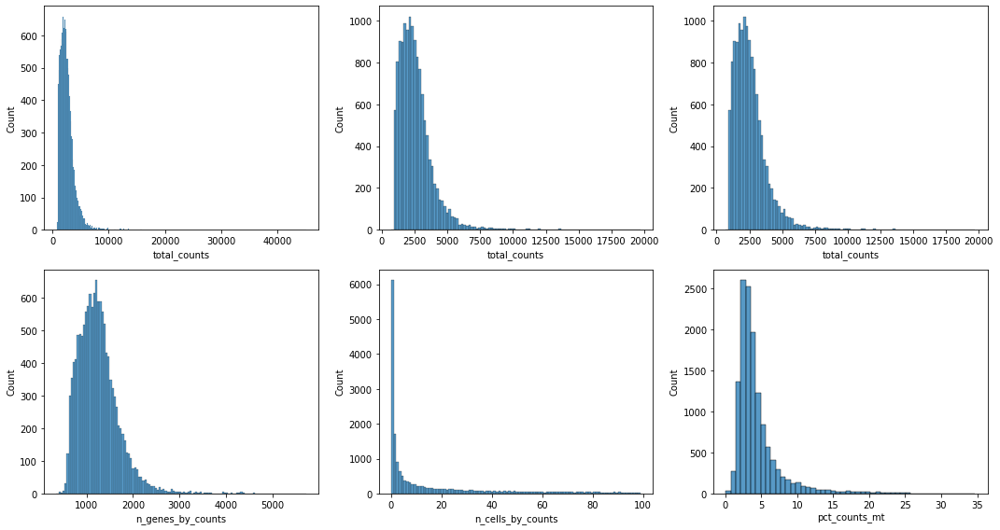

In [36]:
# Calculate QC metrics
sc_adata_3.var['mt'] = sc_adata_3.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata_3, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata_3.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata_3.obs["total_counts"][sc_adata_3.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata_3.obs["total_counts"][sc_adata_3.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata_3.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata_3.var["n_cells_by_counts"][sc_adata_3.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata_3.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [37]:
# Filter data
sc.pp.filter_cells(sc_adata_3, min_counts=1000)
sc.pp.filter_cells(sc_adata_3, max_counts=10000)
sc.pp.filter_cells(sc_adata_3, min_genes=500)
sc_adata_3 = sc_adata_3[sc_adata_3.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata_3.n_obs}")

sc.pp.filter_genes(sc_adata_3, min_cells=15)
print(f"#genes after minimum cells per gene filter: {sc_adata_3.n_vars}")

#cells after count filter: 13109


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


#genes after minimum cells per gene filter: 18007


In [38]:
Counter(list(sc_adata_3.obs['celltype_minor_lv1']))

Counter({'Natural killer cells': 2700,
         'B cells': 1200,
         'T cells': 4335,
         'Plasma B cells': 159,
         'Innate lymphoid cells A': 273,
         'Cytotoxic T cells': 4011,
         'Regulatory T cells': 300,
         'Innate lymphoid cells B': 131})

In [39]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata_3, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata_3)

# Z scale
# sc.pp.scale(sc_adata_3)

In [40]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata_3 = sc_adata_3[:, np.isin(sc_adata_3.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata_3, 'celltype_minor_lv1', method='wilcoxon')
cell_types_3 = sc_adata_3.uns['rank_genes_groups']['names'].dtype.names

markers_3 = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata_3.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata_3.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers_3[cell_types_3[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [41]:
for cell_type in cell_types_3:
    print(cell_type)
    print(markers_3[cell_type])

B cells
['HLA-DRA', 'TNFRSF13C', 'CD83', 'HLA-DRB1', 'MS4A1', 'HLA-DQA1', 'HLA-DPB1', 'CD79A', 'HLA-DPA1', 'BLK', 'PAX5', 'CD79B', 'CD22', 'PTK2', 'STAP1', 'TNFRSF13B', 'RB1', 'CCR7', 'BCL2', 'IFNGR2', 'CD40', 'SELL', 'CD70', 'PPARD', 'CD19', 'CD86', 'POU2AF1', 'MYC', 'FCER2', 'BTLA']
Cytotoxic T cells
['CCL5', 'CD3D', 'CCL4', 'CD8A', 'GZMH', 'CD3E', 'CD8B', 'NKG7', 'CD3G', 'HLA-B', 'TRAC', 'PTPRC', 'HLA-C', 'CTSW', 'CXCR4', 'CD2', 'GZMA', 'LAG3', 'GNLY', 'XCL1', 'ITGA1', 'KLRC1', 'TGFB1', 'LMNA', 'PRF1', 'IFNG', 'GZMB', 'KLRG1', 'TRBC1', 'IKZF2']
Innate lymphoid cells A
['XCL1', 'KLRC1', 'NFKB1', 'KLRB1', 'GNLY', 'IL12RB2', 'NCAM1', 'CTSW', 'IGF1R', 'JAK1', 'FOS', 'PRF1', 'TNFRSF18', 'NKG7', 'DUSP1', 'NFKBIA', 'STAT4', 'KLRF1', 'SH2D1B', 'CDK6', 'KIR2DL4', 'CCL4', 'IL2RB', 'EPHA4', 'BRAF']
Innate lymphoid cells B
['XCL1', 'KLRB1', 'NFKB1', 'TNFRSF18', 'FOS', 'NFKBIA', 'CTSW', 'CTNNB1', 'KIT', 'TNFRSF4', 'LMNA', 'AKT3', 'IL2RA', 'ZEB1']
Natural killer cells
['NKG7', 'PRF1', 'GNLY', 'GZ

Subset 4 - Myeloid

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


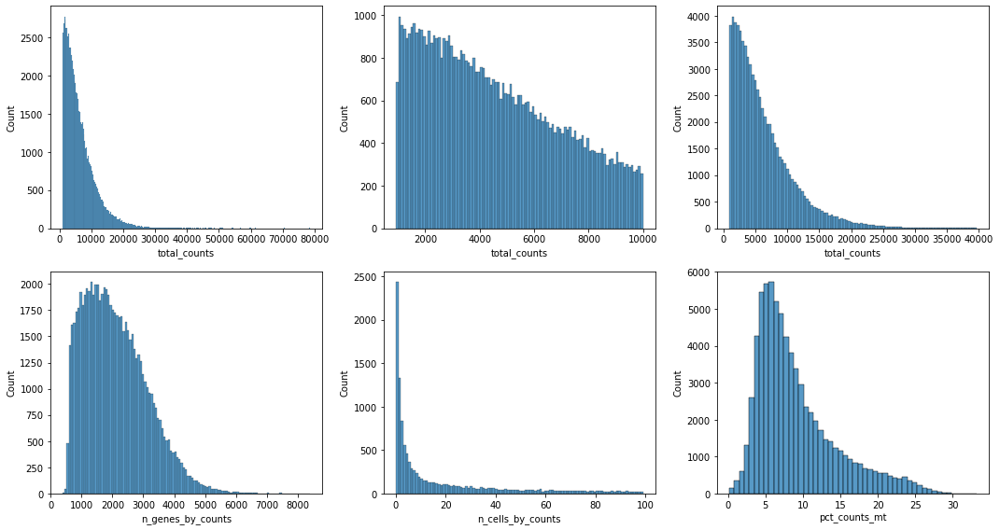

In [42]:
# Calculate QC metrics
sc_adata_4.var['mt'] = sc_adata_4.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata_4, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata_4.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata_4.obs["total_counts"][sc_adata_4.obs["total_counts"] < 10000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata_4.obs["total_counts"][sc_adata_4.obs["total_counts"] < 40000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata_4.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata_4.var["n_cells_by_counts"][sc_adata_4.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata_4.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [43]:
# Filter data
sc.pp.filter_cells(sc_adata_4, min_counts=2000)
sc.pp.filter_cells(sc_adata_4, max_counts=25000)
sc.pp.filter_cells(sc_adata_4, min_genes=600)
sc_adata_4 = sc_adata_4[sc_adata_4.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata_4.n_obs}")

sc.pp.filter_genes(sc_adata_4, min_cells=25)
print(f"#genes after minimum cells per gene filter: {sc_adata_4.n_vars}")

#cells after count filter: 62371


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


#genes after minimum cells per gene filter: 21619


In [44]:
Counter(list(sc_adata_4.obs['celltype_minor_lv1']))

Counter({'Nonclassical monocyte': 857,
         'Alveolar macrophage cells': 21565,
         'Classical monocyte': 4661,
         'Macrophage': 33579,
         'Conventional type 2 dendritic cells': 1254,
         'Conventional type 1 dendritic cells': 186,
         'Langerhans dendritic cells': 18,
         'Mast': 68,
         'Plasmacytoid dendritic cells': 45,
         'Mature dendritic cells': 138})

In [45]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata_4, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata_4)

# Z scale
# sc.pp.scale(sc_adata_4)

In [46]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata_4 = sc_adata_4[:, np.isin(sc_adata_4.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata_4, 'celltype_minor_lv1', method='wilcoxon')
cell_types_4 = sc_adata_4.uns['rank_genes_groups']['names'].dtype.names

markers_4 = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata_4.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata_4.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers_4[cell_types_4[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [47]:
for cell_type in cell_types_4:
    print(cell_type)
    print(markers_4[cell_type])

Alveolar macrophage cells
['MSR1', 'C1QC', 'TCF7L2', 'SERPINA1', 'FN1', 'NRP1', 'GPX3', 'HLA-DQA1', 'HLA-DRB1', 'PECAM1', 'HLA-DPA1', 'MARCO', 'AKT3', 'CXCL16', 'HLA-DRA', 'TGM2', 'HLA-DPB1', 'FCGR3A', 'MMP2', 'LGALS9', 'JUN', 'PDK4', 'SELPLG', 'LRP1', 'LMNA', 'TAPBP', 'BCL2L1', 'SIGLEC1', 'WWTR1', 'CD276']
Classical monocyte
['S100A9', 'IL1R2', 'MAP2K1', 'VSIR', 'CD14', 'HIF1A', 'CSF3R', 'PTPRC', 'ITGAX', 'SOCS3', 'ITGB2', 'PTEN', 'STAT3', 'SELL', 'IL10', 'ITGAM', 'NKG7', 'FLT1', 'TLR2', 'FOS', 'ITGB1', 'JUNB', 'DUSP1', 'SOD2', 'MAFB', 'CDKN1A', 'BRAF', 'PPARD', 'IL6R', 'CD163']
Conventional type 1 dendritic cells
['HLA-DPB1', 'HLA-DQA1', 'CSF2RA', 'HLA-DPA1', 'CD83', 'HLA-DRA', 'HLA-DRB1', 'ZEB1', 'IDO1', 'CD226', 'CD80', 'PKIB', 'CXCR4', 'PTK2', 'NFKB1', 'IL1R2', 'CIITA', 'XCR1', 'NLRC5', 'EZH2', 'HAVCR2', 'BTLA', 'CXCL16', 'CDK6', 'NFE2L2', 'CD86', 'PTEN', 'ITGA4', 'JUNB', 'CCL17']
Conventional type 2 dendritic cells
['CSF2RA', 'HLA-DPB1', 'HLA-DQA1', 'HLA-DPA1', 'NFKB1', 'HLA-DRA'

Subset 5 - Stromal

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/ipykernel_launcher.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  


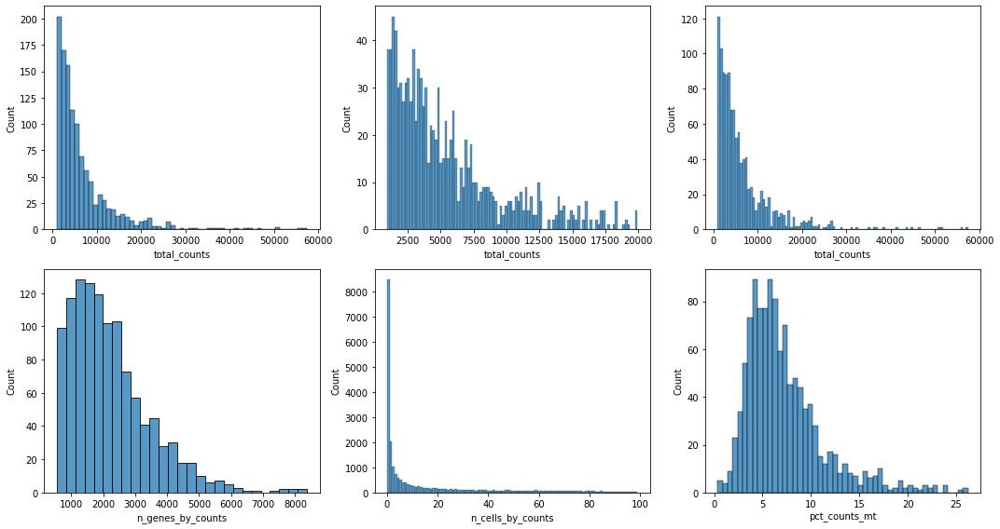

In [48]:
# Calculate QC metrics
sc_adata_5.var['mt'] = sc_adata_5.var_names.str.startswith('MT')
sc.pp.calculate_qc_metrics(sc_adata_5, qc_vars=["mt"], inplace=True)

# Plot metrics to pick the values for filtering
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
sns.histplot(sc_adata_5.obs["total_counts"], kde=False, ax=axs[0, 0])
sns.histplot(sc_adata_5.obs["total_counts"][sc_adata_5.obs["total_counts"] < 20000], bins=100, kde=False, ax=axs[0, 1])
sns.histplot(sc_adata_5.obs["total_counts"][sc_adata_5.obs["total_counts"] < 80000], bins=100, kde=False, ax=axs[0, 2])
sns.histplot(sc_adata_5.obs["n_genes_by_counts"], kde=False, ax=axs[1, 0])
sns.histplot(sc_adata_5.var["n_cells_by_counts"][sc_adata_5.var["n_cells_by_counts"] < 100], kde=False, bins=100, ax=axs[1,1])
sns.histplot(sc_adata_5.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[1, 2])

fig.tight_layout()

In [49]:
# Filter data
sc.pp.filter_cells(sc_adata_5, min_counts=1000)
sc.pp.filter_cells(sc_adata_5, max_counts=40000)
sc.pp.filter_cells(sc_adata_5, min_genes=500)
sc_adata_5 = sc_adata_5[sc_adata_5.obs.pct_counts_mt < 30, :] 
print(f"#cells after count filter: {sc_adata_5.n_obs}")

sc.pp.filter_genes(sc_adata_5, min_cells=15)
print(f"#genes after minimum cells per gene filter: {sc_adata_5.n_vars}")

#cells after count filter: 1130
#genes after minimum cells per gene filter: 14351


/mnt/envs/dev-nkeener/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [50]:
Counter(list(sc_adata_5.obs['celltype_minor_lv1']))

Counter({'Fibroblast': 841,
         'Myofibroblast': 197,
         'Smooth muscle cells': 68,
         'Pericyte': 24})

In [51]:
# Normalize and log transform
sc.pp.normalize_total(sc_adata_5, inplace=True, exclude_highly_expressed=True)

# Log transform
sc.pp.log1p(sc_adata_5)

# Z scale
# sc.pp.scale(sc_adata_5)

In [52]:
# Find marker genes for celltypes (using only genes shared with spatial data)
sc_adata_5 = sc_adata_5[:, np.isin(sc_adata_5.var.index, sp_adata.var.index)]
sc.tl.rank_genes_groups(sc_adata_5, 'celltype_minor_lv1', method='wilcoxon')
cell_types_5 = sc_adata_5.uns['rank_genes_groups']['names'].dtype.names

markers_5 = defaultdict(list)
pval_thresh = 0.01
for i,row in enumerate(sc_adata_5.uns['rank_genes_groups']['names'][:30]):
    for j,gene in enumerate(row):
        if gene == gene:
            if sc_adata_5.uns['rank_genes_groups']['pvals_adj'][i][j] < pval_thresh:
                markers_5[cell_types_5[j]].append(gene)

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [53]:
for cell_type in cell_types_5:
    print(cell_type)
    print(markers_5[cell_type])

Fibroblast
['MFAP5', 'FBLN1', 'PLA2G2A', 'SFRP2', 'SOD2', 'MYC', 'FGFR1', 'TGFBR2', 'PDPN', 'DUSP1', 'CD248', 'NFKBIA', 'ACKR3', 'NFKB1', 'EGR1', 'TGFBR3', 'FOSL1', 'LDHA', 'JUN', 'FOS', 'JUNB', 'SOCS3', 'MMP2', 'NFE2L2', 'CXCL2', 'IGF1', 'LMNA', 'CSF1', 'VEGFA', 'WWTR1']
Myofibroblast
['FN1', 'ANGPT1', 'NRP1', 'ITGA1', 'TNC', 'TGM2']
Pericyte
['COL4A1', 'PDGFRB', 'PTEN', 'NDUFA4L2', 'ITGA1']
Smooth muscle cells
['MYH11', 'ACTA2', 'DES', 'ITGA1', 'CAV1', 'TGM2', 'PDK4', 'COL4A1', 'PDGFRB']


## Cluster and calculate UMAP

In [54]:
n_pcs = 48
n_neighbors = 40
res = 3

# PCA
sc.tl.pca(sp_adata, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata)

# Leiden clustering
sc.tl.leiden(sp_adata, resolution=res)

In [55]:
sp_adata.obs['leiden_main'] = sp_adata.obs['leiden']
del sp_adata.obs['leiden']

n_pcs = 48, n_neighbors = 40, resolution = 3


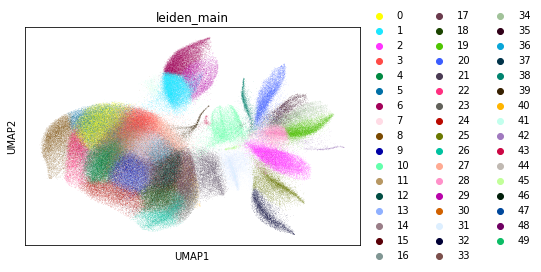

In [56]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata, color=['leiden_main'],
                            cmap='tab20'
                            )

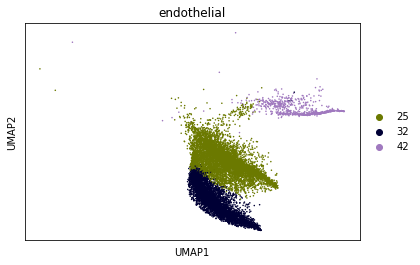

In [57]:
endothelial = sp_adata[np.isin(sp_adata.obs['leiden_main'], ['42','25','32'])]
sc.pl.umap(endothelial, color=['leiden_main'],
                        cmap='tab20',
                        title='endothelial'
                            )

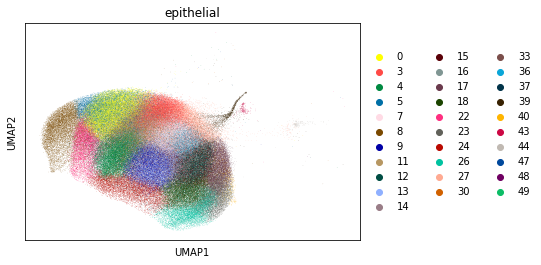

In [58]:
epithelial = sp_adata[np.isin(sp_adata.obs['leiden_main'], ['11','37','16','33','5','8','0','22','30','4','9','24','47','48','49','43','44','23','18','26','40','12','15','17','3','27','7','36','39','13','14'])]
sc.pl.umap(epithelial, color=['leiden_main'],
                        cmap='tab20',
                        title='epithelial'
                            )

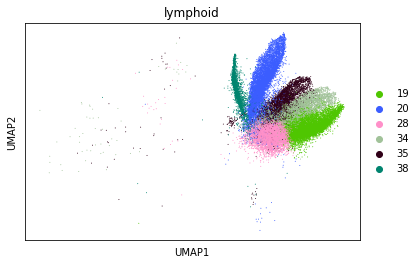

In [59]:
lymphoid = sp_adata[np.isin(sp_adata.obs['leiden_main'], ['35','34','19','28','20','38'])] 
sc.pl.umap(lymphoid, color=['leiden_main'],
                        cmap='tab20',
                        title='lymphoid'
                            )

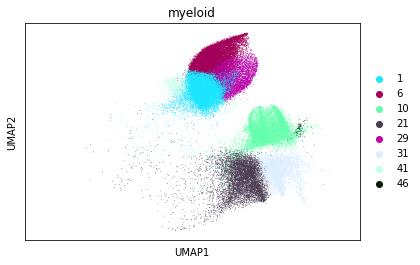

In [60]:
myeloid = sp_adata[np.isin(sp_adata.obs['leiden_main'], ['21','31','10','46','41','1','6','29'])] 
sc.pl.umap(myeloid, color=['leiden_main'],
                        cmap='tab20',
                        title='myeloid'
                            )

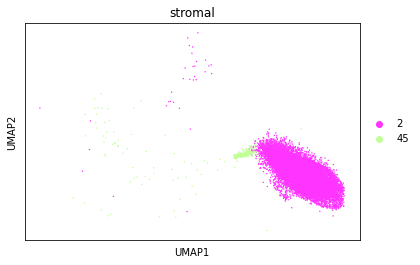

In [61]:
stromal = sp_adata[np.isin(sp_adata.obs['leiden_main'], ['45','2'])] 
sc.pl.umap(stromal, color=['leiden_main'],
                        cmap='tab20',
                        title='stromal'
                            )

## Manual annotation of major cell types

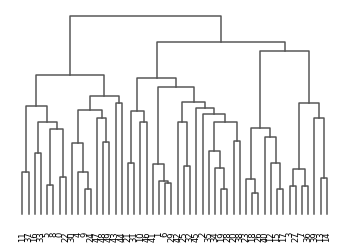

<AxesSubplot:>

In [62]:
sc.tl.dendrogram(sp_adata, 'leiden_main')
sc.pl.dendrogram(sp_adata, 'leiden_main')

Endothelial


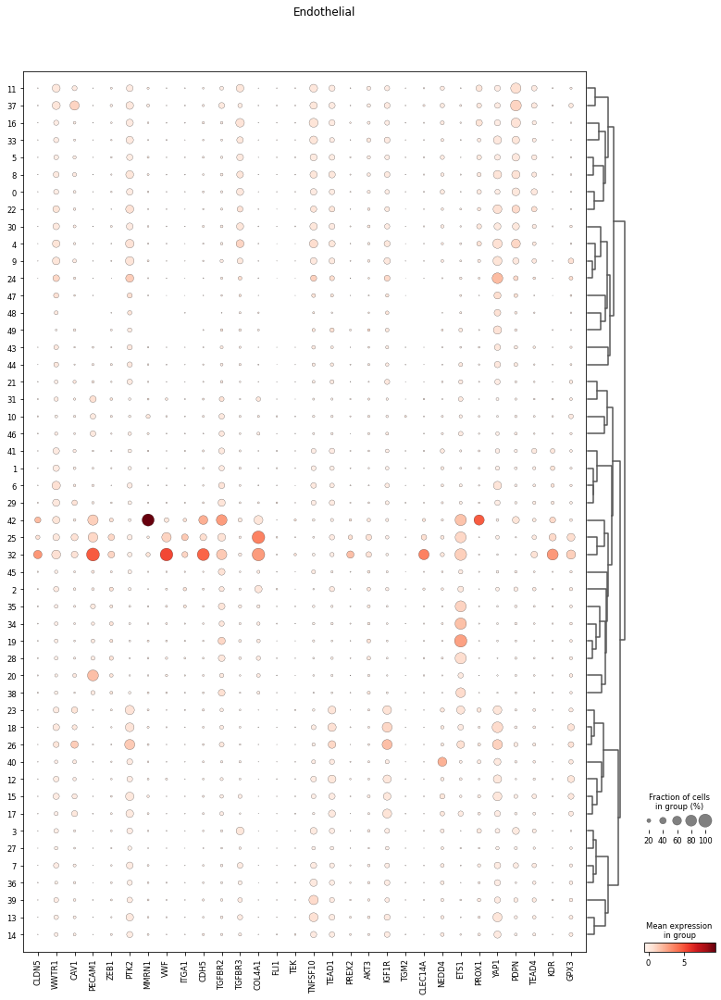

Epithelial


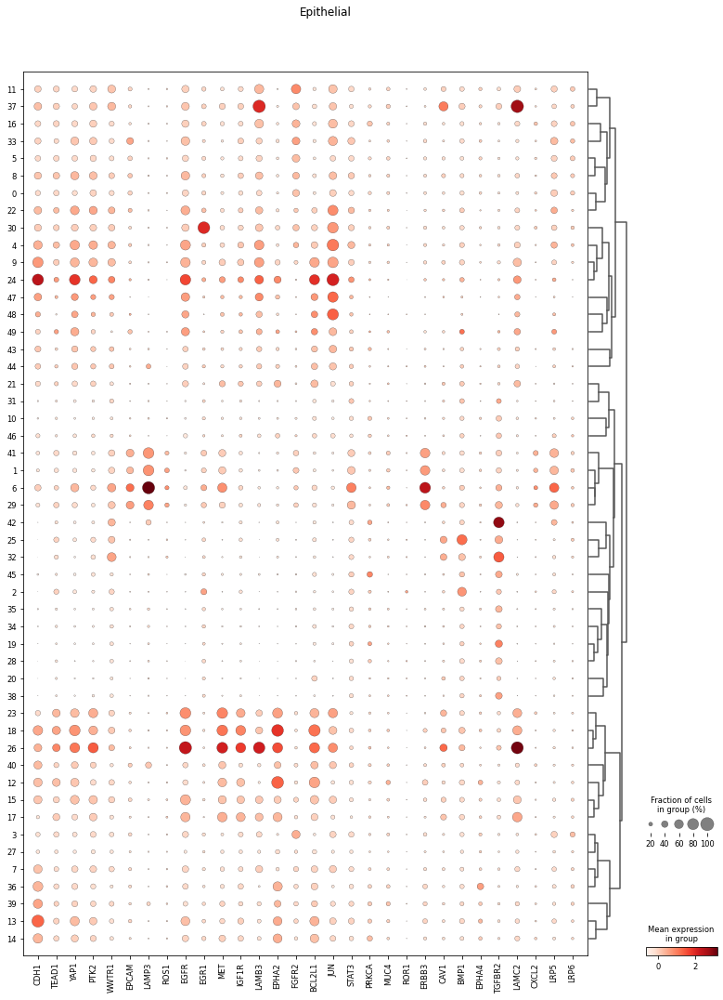

Lymphoid


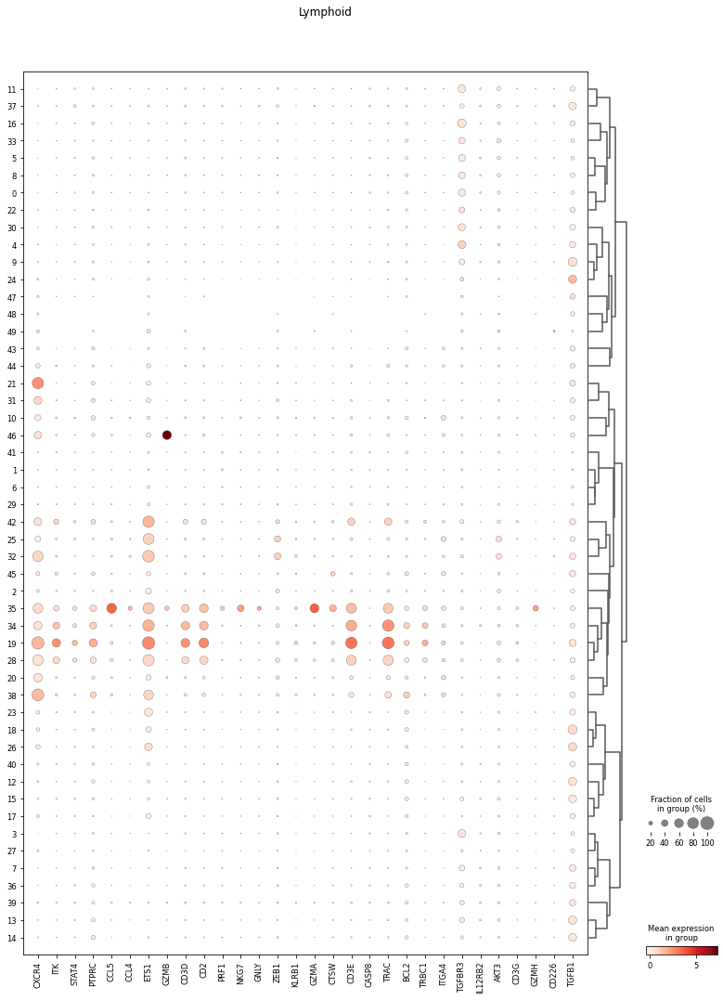

Myeloid


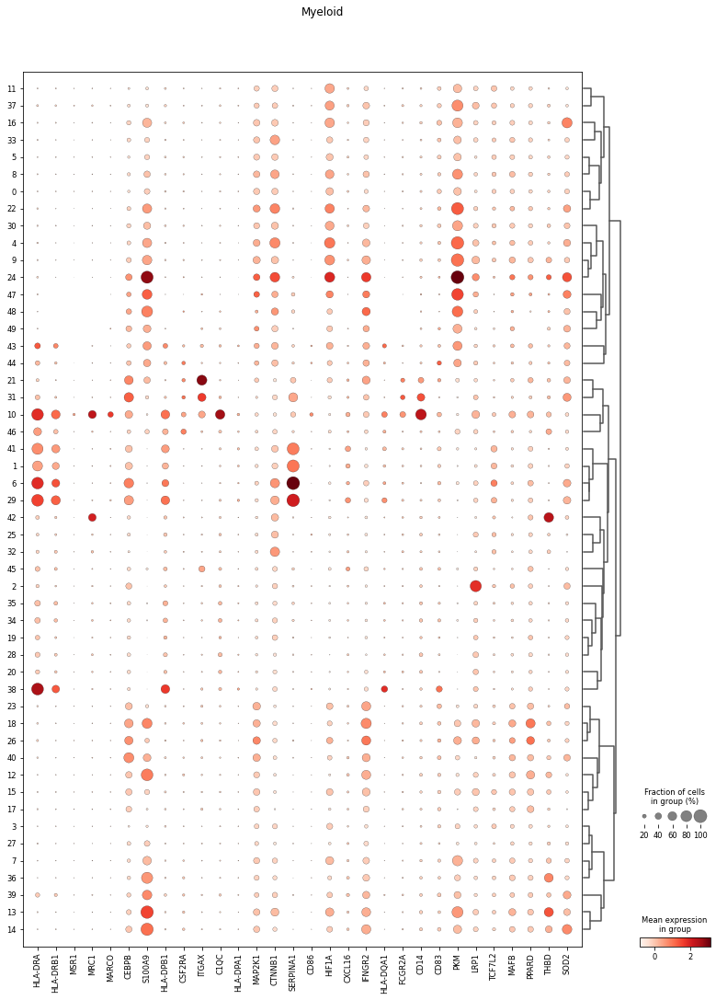

Stromal


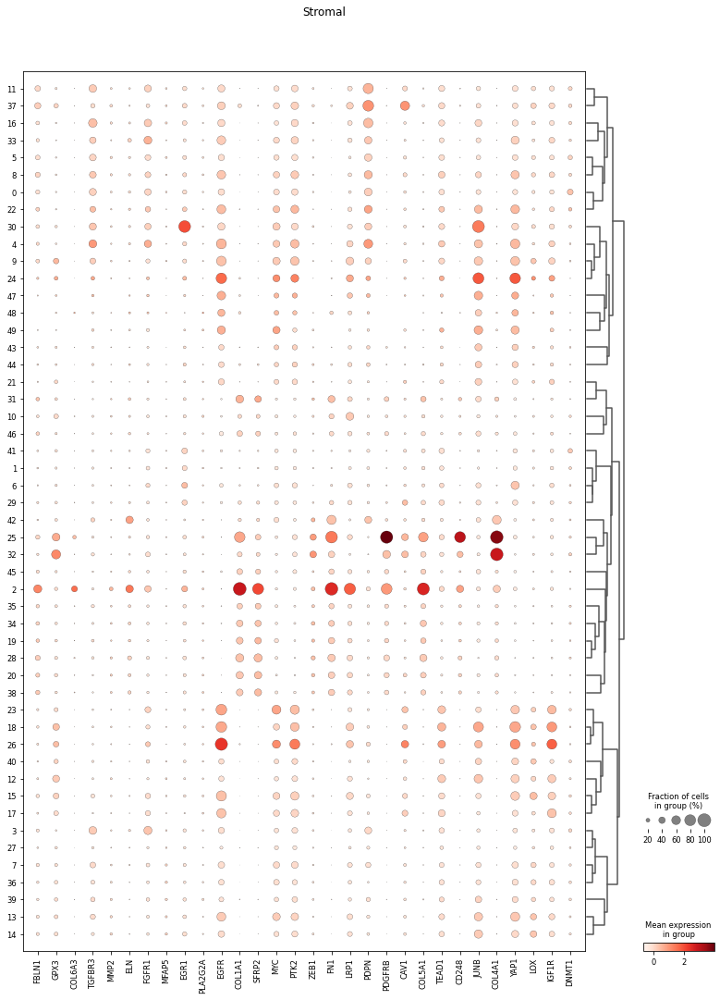

In [63]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers):
    print(celltype)
    sc.pl.dotplot(sp_adata, markers[celltype], groupby='leiden_main', dendrogram=True, title=celltype)

In [64]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# Epithelial
# Endothelial
# Stromal
# Lymphoid
# Myeloid

num_leiden = len(set(sp_adata.obs['leiden_main']))
clusters2types = {k: 'Unassigned' for k in range(0, num_leiden)}

assigned_clusters = {
    'Endothelial': ['42','25','32'],
    'Epithelial': ['11','37','16','33','5','8','0','22','30','4','9','24','47','48','49','43','44','23','18','26','40','12','15','17','3','27','7','36','39','13','14'],
    'Lymphoid': ['35','34','19','28','20','38'],
    'Myeloid': ['21','31','10','46','41','1','6','29'],
    'Stromal': ['45','2']
}

for k1, v1 in clusters2types.items():
    for k2, v2 in assigned_clusters.items():
        for i in v2:
            clusters2types[int(i)] = k2
            
sp_adata.obs['cell_type_manual_major'] = [clusters2types[int(cluster)] for cluster in sp_adata.obs['leiden_main']]
types = list(set(sp_adata.obs['cell_type_manual_major']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata.obs['cell_type_manual_major']]

clusters2types

{0: 'Epithelial',
 1: 'Myeloid',
 2: 'Stromal',
 3: 'Epithelial',
 4: 'Epithelial',
 5: 'Epithelial',
 6: 'Myeloid',
 7: 'Epithelial',
 8: 'Epithelial',
 9: 'Epithelial',
 10: 'Myeloid',
 11: 'Epithelial',
 12: 'Epithelial',
 13: 'Epithelial',
 14: 'Epithelial',
 15: 'Epithelial',
 16: 'Epithelial',
 17: 'Epithelial',
 18: 'Epithelial',
 19: 'Lymphoid',
 20: 'Lymphoid',
 21: 'Myeloid',
 22: 'Epithelial',
 23: 'Epithelial',
 24: 'Epithelial',
 25: 'Endothelial',
 26: 'Epithelial',
 27: 'Epithelial',
 28: 'Lymphoid',
 29: 'Myeloid',
 30: 'Epithelial',
 31: 'Myeloid',
 32: 'Endothelial',
 33: 'Epithelial',
 34: 'Lymphoid',
 35: 'Lymphoid',
 36: 'Epithelial',
 37: 'Epithelial',
 38: 'Lymphoid',
 39: 'Epithelial',
 40: 'Epithelial',
 41: 'Myeloid',
 42: 'Endothelial',
 43: 'Epithelial',
 44: 'Epithelial',
 45: 'Stromal',
 46: 'Myeloid',
 47: 'Epithelial',
 48: 'Epithelial',
 49: 'Epithelial'}

In [65]:
Counter(sp_adata.obs['cell_type_manual_major'])

Counter({'Epithelial': 212495,
         'Myeloid': 56238,
         'Lymphoid': 31826,
         'Stromal': 14963,
         'Endothelial': 12605})

## Plot annotated results

[[0.00520185 0.62910089 0.26995291]
 [0.01158449 0.10945196 0.43779217]
 [0.03025092 0.83074407 0.19683976]
 [0.67466805 0.66829927 0.56689789]
 [0.40043309 0.40206521 0.96472158]]


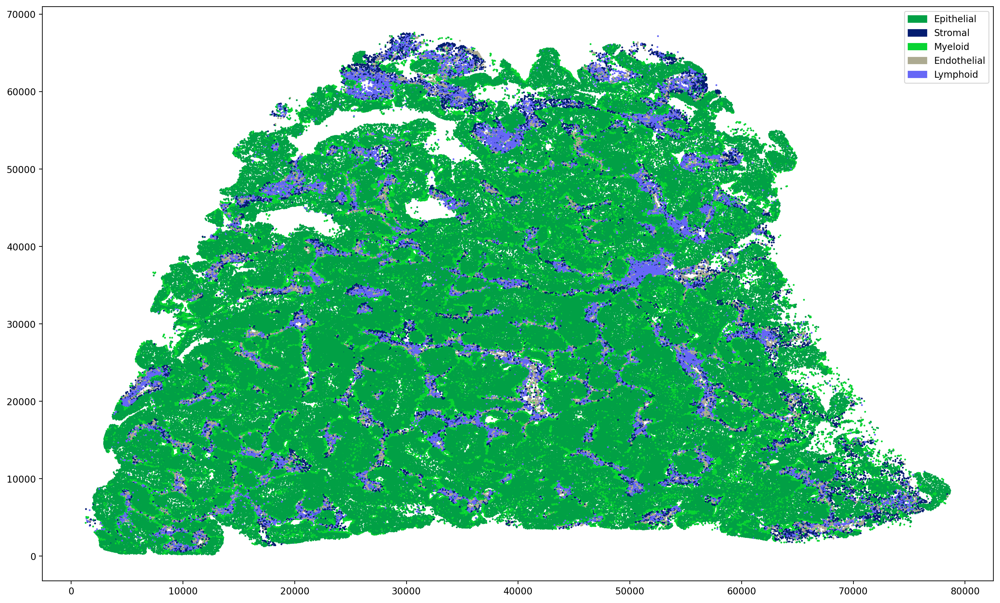

In [66]:
fig = plt.figure(figsize=(15, 9), constrained_layout=True, dpi=200)
color_tups = np.random.rand(np.max(sp_adata.obs['int_type'])+1,3)
print(color_tups)

handles = []
for int_type in set(sp_adata.obs['int_type']):
    handles.append(mpatches.Patch(color=color_tups[int_type], label=types[int_type]))
    

plt.scatter(sp_adata.obs["x"], 
              sp_adata.obs["y"],
              c=sp_adata.obs['int_type'], 
              cmap=matplotlib.colors.ListedColormap(color_tups),
              s=1, alpha=1.0)

plt.legend(handles=handles)

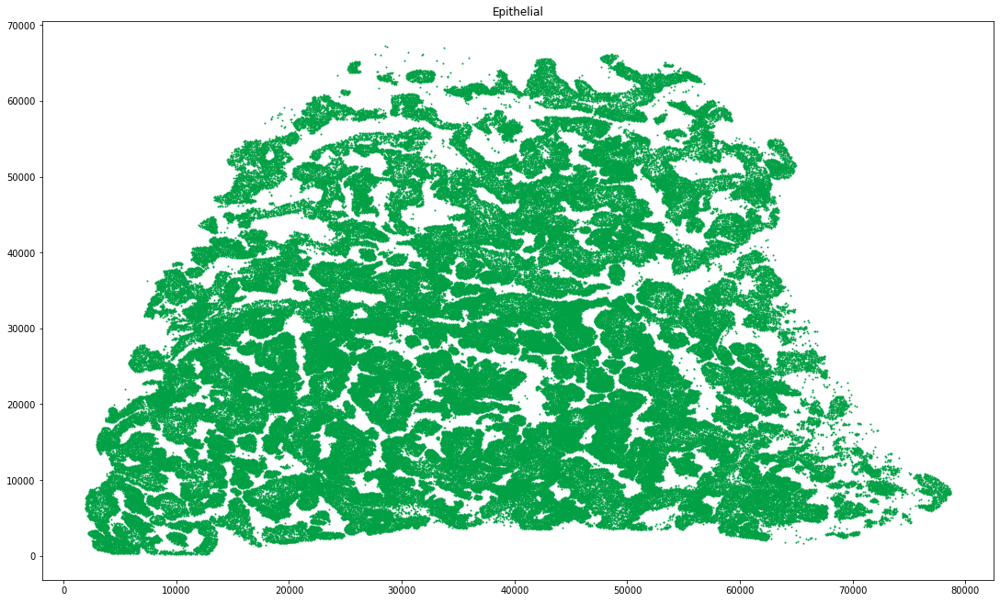

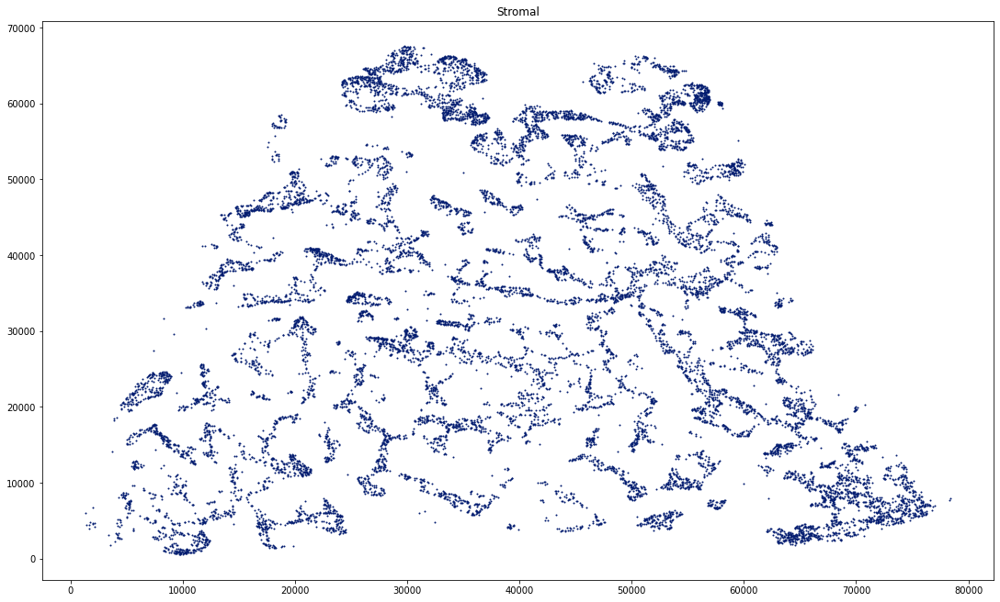

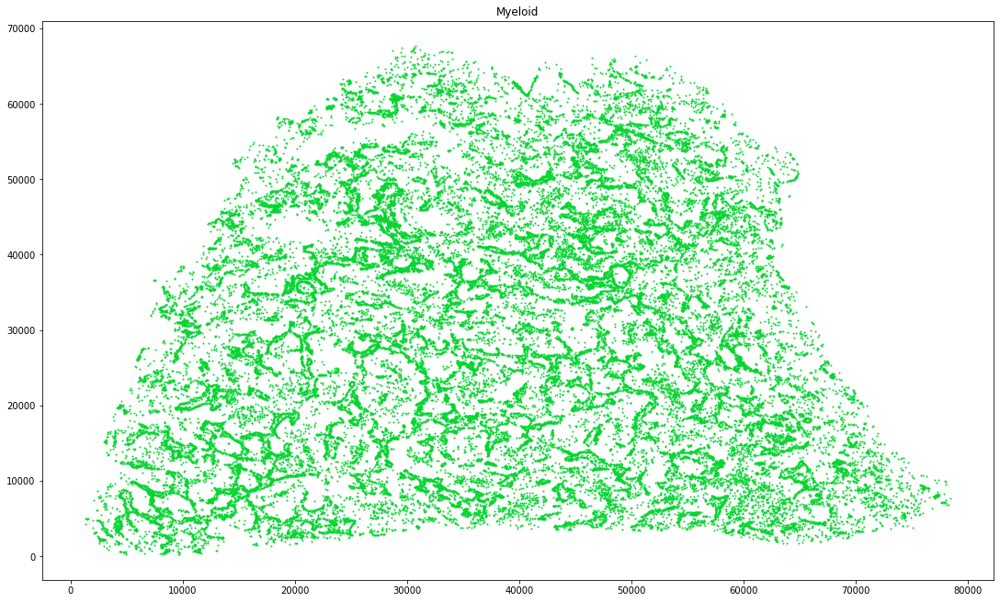

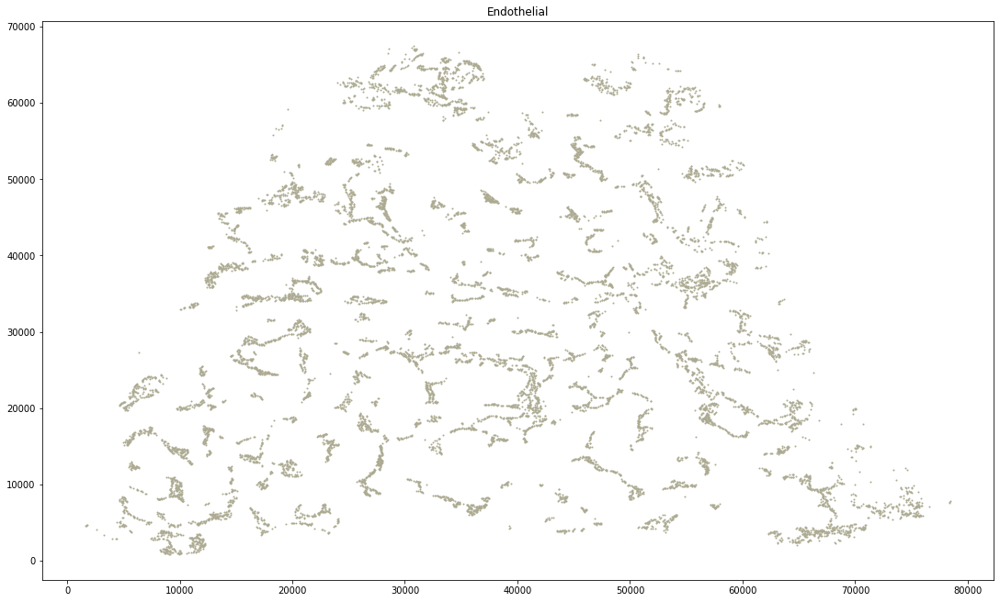

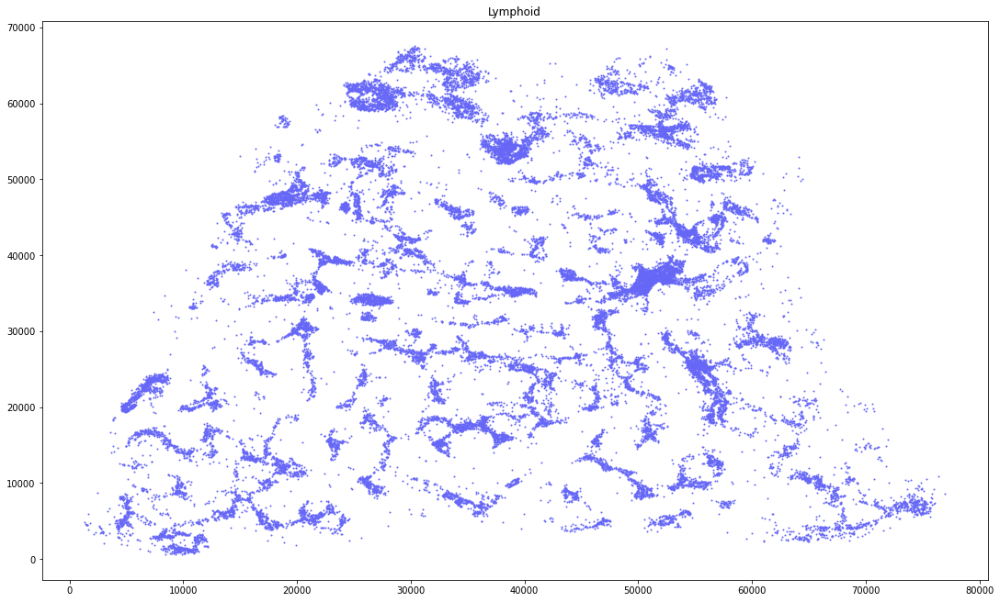

In [67]:
types = list(set(sp_adata.obs['cell_type_manual_major']))
for cell_type in types:
    
    type_adata = sp_adata[sp_adata.obs['cell_type_manual_major'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

## Subset merfish data based on major cell types and manual annotation of minor cell types

In [68]:
sp_adata_1 = sp_adata[np.isin(sp_adata.obs['cell_type_manual_major'], ['Endothelial'])] 
sp_adata_2 = sp_adata[np.isin(sp_adata.obs['cell_type_manual_major'], ['Epithelial'])] 
sp_adata_3 = sp_adata[np.isin(sp_adata.obs['cell_type_manual_major'], ['Lymphoid'])] 
sp_adata_4 = sp_adata[np.isin(sp_adata.obs['cell_type_manual_major'], ['Myeloid'])] 
sp_adata_5 = sp_adata[np.isin(sp_adata.obs['cell_type_manual_major'], ['Stromal'])] 

In [69]:
sp_adata.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata.h5ad')
sp_adata_1.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_1.h5ad')
sp_adata_2.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_2.h5ad')
sp_adata_3.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_3.h5ad')
sp_adata_4.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_4.h5ad')
sp_adata_5.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_5.h5ad')

/mnt/envs/dev-nkeener/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [126]:
sp_adata = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata.h5ad')
sp_adata_1 = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_1.h5ad')
sp_adata_2 = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_2.h5ad')
sp_adata_3 = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_3.h5ad')
sp_adata_4 = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_4.h5ad')
sp_adata_5 = ad.read(f'/mnt/uydnguye/predict_celltype_lung_cancer/test_scanpy/sp_adata_5.h5ad')

### Endothelial

In [127]:
# Already ran permutation functions to find the best PC, neighbors and resolution
# n_pcs = 3
# n_neighbors = 10
# res = 3
n_pcs = 30
n_neighbors = 30
res = 0.7

# PCA
sc.tl.pca(sp_adata_1, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata_1, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata_1)

# Leiden clustering
sc.tl.leiden(sp_adata_1, resolution=res)

n_pcs = 30, n_neighbors = 30, resolution = 0.7


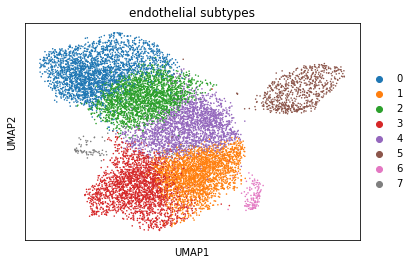

In [128]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata_1, color=['leiden'],
                        cmap='tab20',
                        title='endothelial subtypes',
                            )

In [129]:
# lymphatic = sp_adata_1[np.isin(sp_adata_1.obs['leiden'], [])] 
# sc.pl.umap(lymphatic, color=['leiden'],
#                         cmap='tab20',
#                         title='lymphatic cells',
#                             )

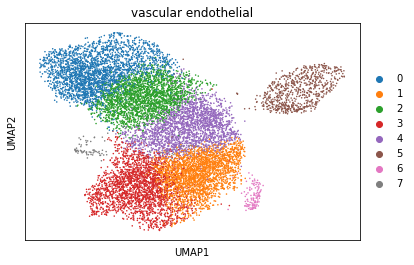

In [130]:
ve = sp_adata_1[np.isin(sp_adata_1.obs['leiden'], ['0','2','3','7','5','6','1','4'])] 
sc.pl.umap(ve, color=['leiden'],
                        cmap='tab20',
                        title='vascular endothelial',
                            )

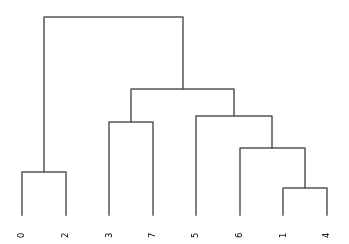

<AxesSubplot:>

In [131]:
sc.tl.dendrogram(sp_adata_1, 'leiden')
sc.pl.dendrogram(sp_adata_1, 'leiden')

Lymphatic cells


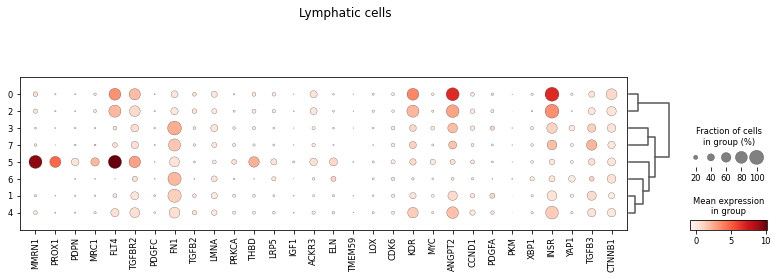

Vascular endothelial arterial


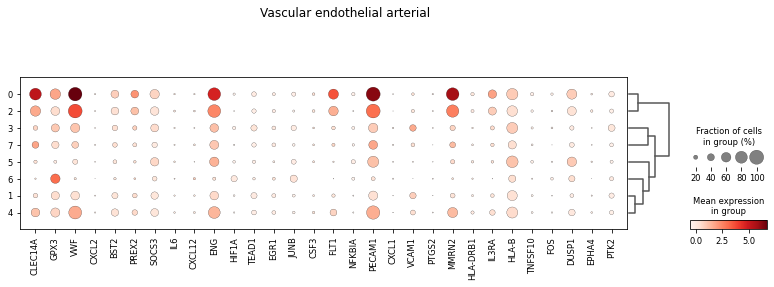

Vascular endothelial capillary A


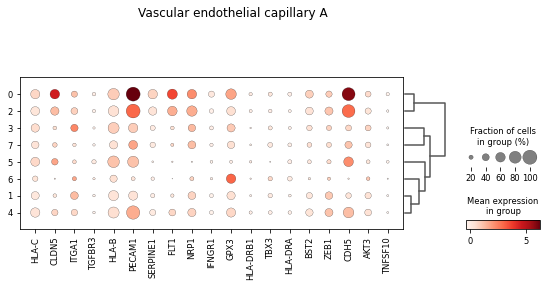

Vascular endothelial capillary B


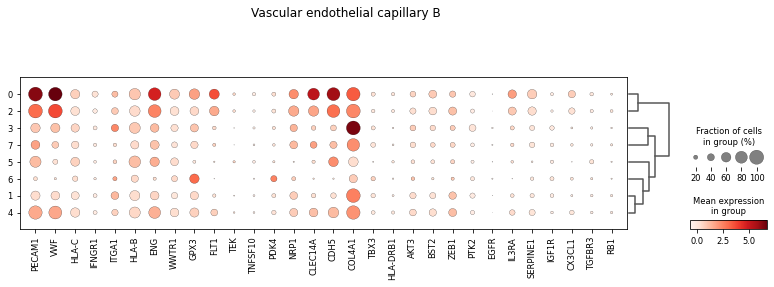

Vascular endothelial peribronchial


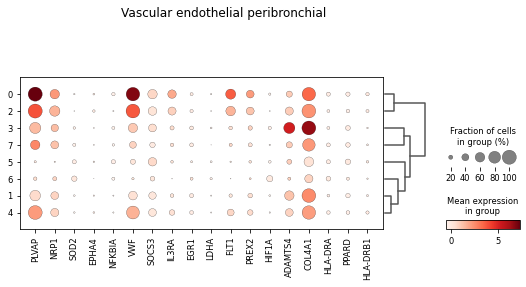

Vascular endothelial venous


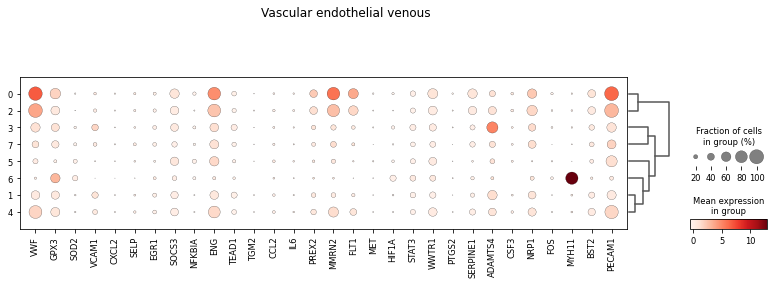

In [132]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers_1):
    print(celltype)
    sc.pl.dotplot(sp_adata_1, markers_1[celltype], groupby='leiden', dendrogram=True, title=celltype)

In [133]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# Lymphatic cells
# Vascular endothelial

num_leiden = len(set(sp_adata_1.obs['leiden']))
clusters2types = {k: 'Endothelial' for k in range(0, num_leiden)}

assigned_clusters = {
    'Lymphatic cells': [],
    'Vascular endothelial': ['0','2','3','7','5','6','1','4']
}

for k1, v1 in clusters2types.items():
    for k2, v2 in assigned_clusters.items():
        for i in v2:
            clusters2types[int(i)] = k2
            
sp_adata_1.obs['cell_type_manual_minor'] = [clusters2types[int(cluster)] for cluster in sp_adata_1.obs['leiden']]
types = list(set(sp_adata_1.obs['cell_type_manual_minor']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata_1.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata_1.obs['cell_type_manual_minor']]

clusters2types

{0: 'Vascular endothelial',
 1: 'Vascular endothelial',
 2: 'Vascular endothelial',
 3: 'Vascular endothelial',
 4: 'Vascular endothelial',
 5: 'Vascular endothelial',
 6: 'Vascular endothelial',
 7: 'Vascular endothelial'}

In [134]:
Counter(sp_adata_1.obs['cell_type_manual_minor'])

Counter({'Vascular endothelial': 12605})

## Plot annotated results

[[0.75560111 0.68453528 0.65158299]]


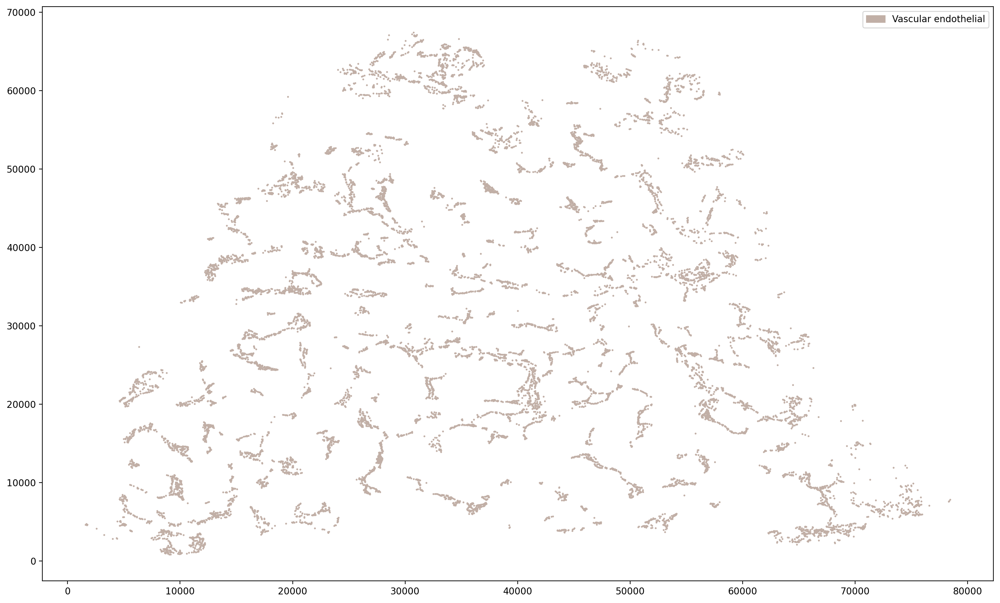

In [135]:
fig = plt.figure(figsize=(15, 9), constrained_layout=True, dpi=200)
color_tups = np.random.rand(np.max(sp_adata_1.obs['int_type'])+1,3)
print(color_tups)

handles = []
for int_type in set(sp_adata_1.obs['int_type']):
    handles.append(mpatches.Patch(color=color_tups[int_type], label=types[int_type]))
    

plt.scatter(sp_adata_1.obs["x"], 
              sp_adata_1.obs["y"],
              c=sp_adata_1.obs['int_type'], 
              cmap=matplotlib.colors.ListedColormap(color_tups),
              s=1, alpha=1.0)

plt.legend(handles=handles)

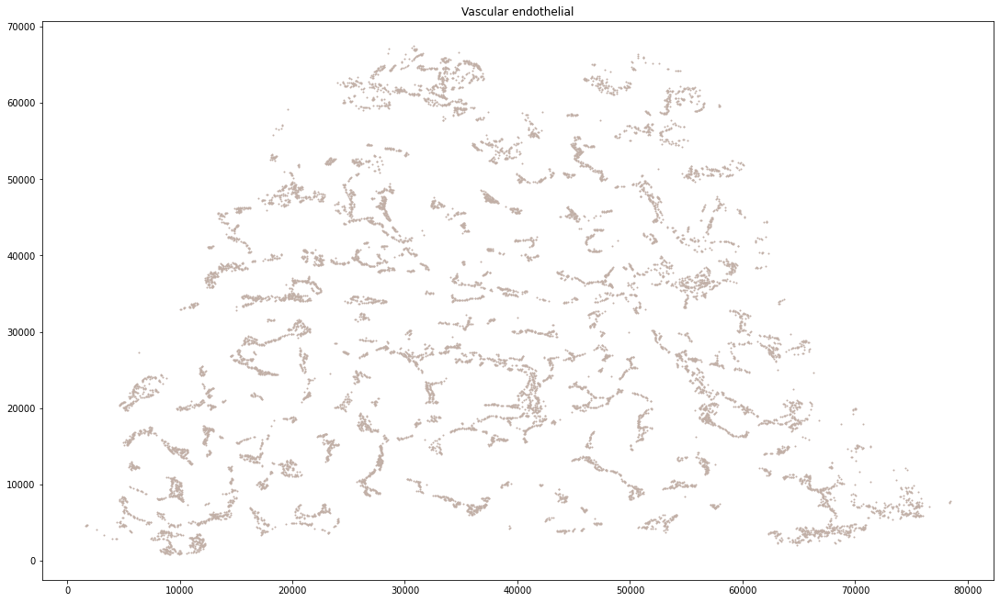

In [136]:
types = list(set(sp_adata_1.obs['cell_type_manual_minor']))
for cell_type in types:
    
    type_adata = sp_adata_1[sp_adata_1.obs['cell_type_manual_minor'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

### Epithelial

In [137]:
# Already ran permutation functions to find the best PC, neighbors and resolution
n_pcs = 14
n_neighbors = 48
res = 0.5

# PCA
sc.tl.pca(sp_adata_2, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata_2, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata_2)

# Leiden clustering
sc.tl.leiden(sp_adata_2, resolution=res)

n_pcs = 14, n_neighbors = 48, resolution = 0.5


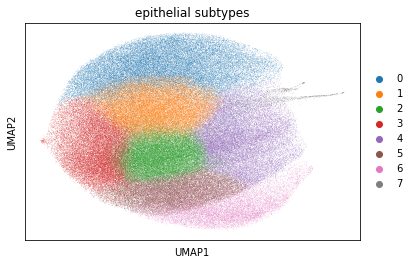

In [138]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata_2, color=['leiden'],
                        cmap='tab20',
                        title='epithelial subtypes',         
                            )

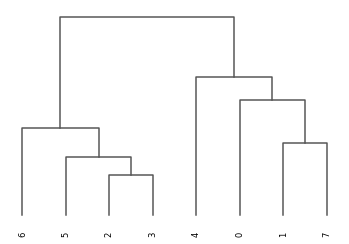

<AxesSubplot:>

In [139]:
sc.tl.dendrogram(sp_adata_2, 'leiden')
sc.pl.dendrogram(sp_adata_2, 'leiden')

Alveolar epithelial type I


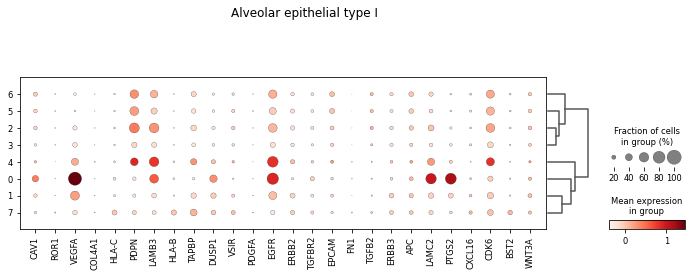

Alveolar epithelial type II


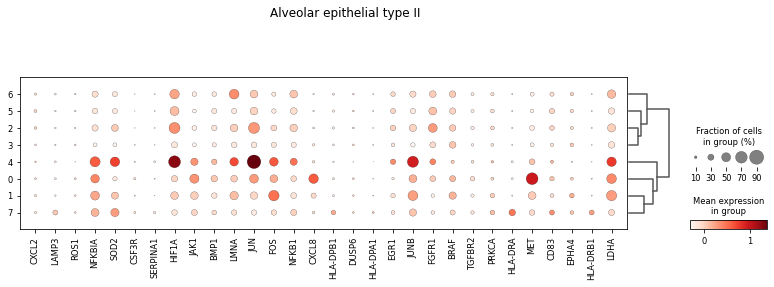

Basal


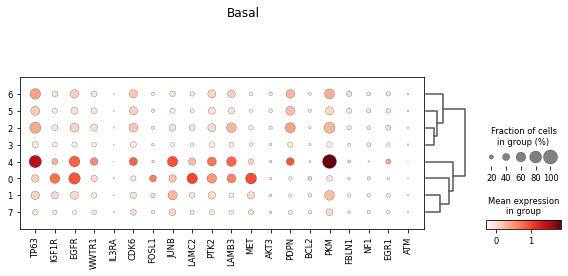

Ciliated


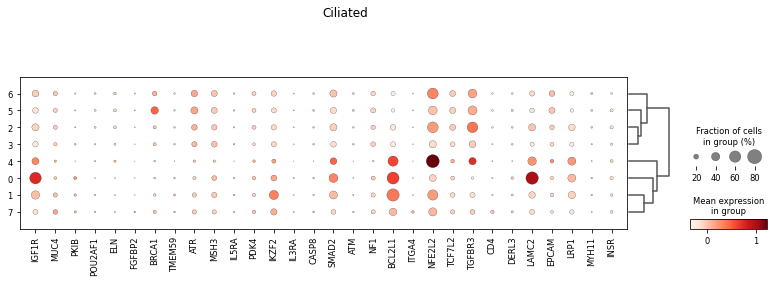

Club


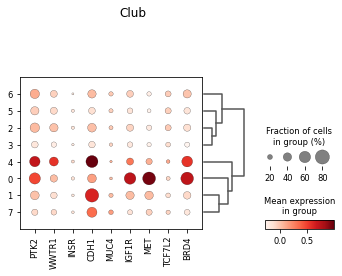

Goblet


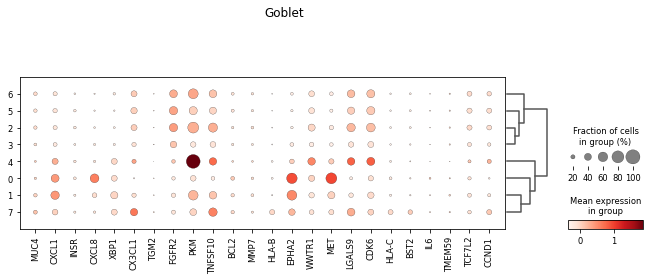

Mesothelial


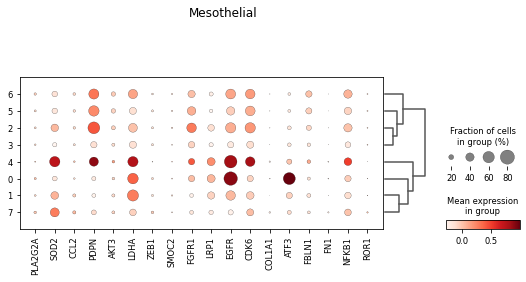

In [140]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers_2):
    print(celltype)
    sc.pl.dotplot(sp_adata_2, markers_2[celltype], groupby='leiden', dendrogram=True, title=celltype)

In [141]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# Alveolar epithelial type I
# Alveolar epithelial type II
# Basal
# Ciliated
# Club
# Goblet
# Mesothelial

num_leiden = len(set(sp_adata_2.obs['leiden']))
clusters2types = {k: 'Epithelial' for k in range(0, num_leiden)}

# assigned_clusters = {
#     'Alveolar epithelial type I': [],
#     'Alveolar epithelial type II': [],
#     'Basal': [],
#     'Ciliated': [],
#     'Club': [],
#     'Goblet': [],
#     'Mesothelial': []
# }

# for k1, v1 in clusters2types.items():
#     for k2, v2 in assigned_clusters.items():
#         for i in v2:
#             clusters2types[int(i)] = k2

sp_adata_2.obs['cell_type_manual_minor'] = [clusters2types[int(cluster)] for cluster in sp_adata_2.obs['leiden']]
types = list(set(sp_adata_2.obs['cell_type_manual_minor']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata_2.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata_2.obs['cell_type_manual_minor']]

clusters2types

{0: 'Epithelial',
 1: 'Epithelial',
 2: 'Epithelial',
 3: 'Epithelial',
 4: 'Epithelial',
 5: 'Epithelial',
 6: 'Epithelial',
 7: 'Epithelial'}

In [225]:
Counter(sp_adata_2.obs['cell_type_manual_minor'])

Counter({'Epithelial': 212495})

## Plot annotated results

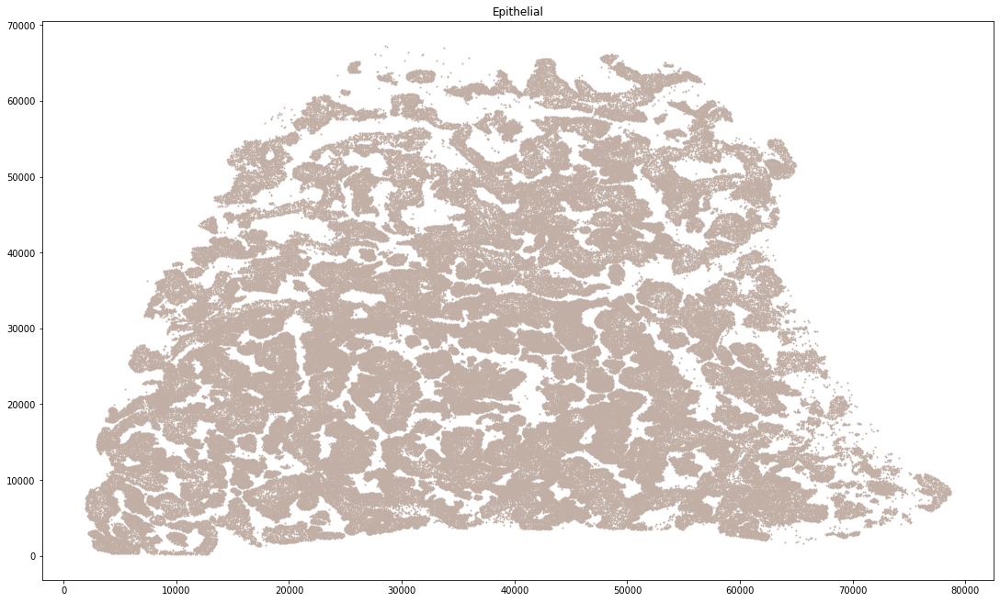

In [142]:
types = list(set(sp_adata_2.obs['cell_type_manual_minor']))
for cell_type in types:
    
    type_adata = sp_adata_2[sp_adata_2.obs['cell_type_manual_minor'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

### Lymphoid

In [143]:
# Already ran permutation functions to find the best PC, neighbors and resolution
n_pcs = 20
n_neighbors = 20
res = 0.5

# PCA
sc.tl.pca(sp_adata_3, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata_3, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata_3)

# Leiden clustering
sc.tl.leiden(sp_adata_3, resolution=res)

n_pcs = 20, n_neighbors = 20, resolution = 0.5


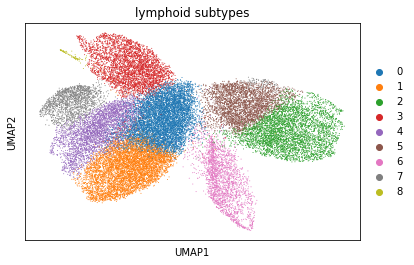

In [144]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata_3, color=['leiden'],
                        cmap='tab20',
                        title='lymphoid subtypes',
                            )

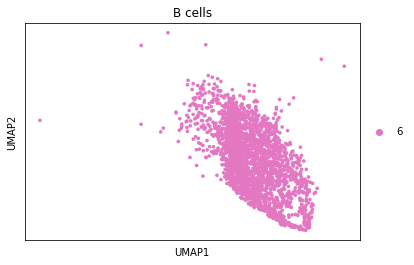

In [145]:
B_cells = sp_adata_3[np.isin(sp_adata_3.obs['leiden'], ['6'])] 
sc.pl.umap(B_cells, color=['leiden'],
                        cmap='tab20',
                        title='B cells'
                            )

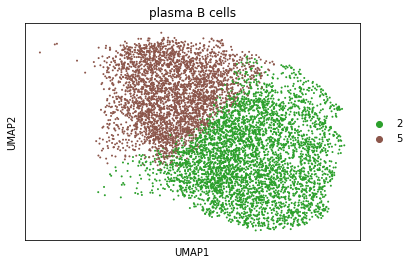

In [146]:
plasma_B_cells = sp_adata_3[np.isin(sp_adata_3.obs['leiden'], ['2','5'])] 
sc.pl.umap(plasma_B_cells, color=['leiden'],
                        cmap='tab20',
                        title='plasma B cells'
                            )

In [147]:
# NK_ILC = sp_adata_3[np.isin(sp_adata_3.obs['leiden'], [])] 
# sc.pl.umap(NK_ILC, color=['leiden'],
#                         cmap='tab20',
#                         title='natural killer cells + innate lymphoid A and B',
#                             )

In [148]:
# T_cells = sp_adata_3[np.isin(sp_adata_3.obs['leiden'], [])] 
# sc.pl.umap(T_cells, color=['leiden'],
#                         cmap='tab20',
#                         title='T cells + cytotoxic T cells + regulatory T cells'
#                             )

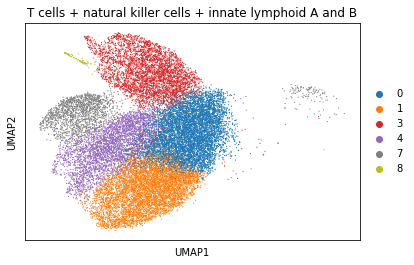

In [149]:
T_cells_NK_ILC = sp_adata_3[np.isin(sp_adata_3.obs['leiden'], ['8','0','3','1','4','7'])] 
sc.pl.umap(T_cells_NK_ILC, color=['leiden'],
                        cmap='tab20',
                        title='T cells + natural killer cells + innate lymphoid A and B'
                            )

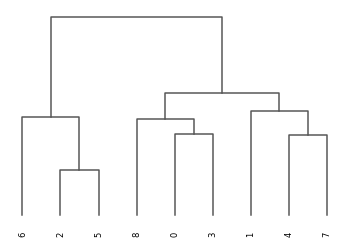

<AxesSubplot:>

In [150]:
sc.tl.dendrogram(sp_adata_3, 'leiden')
sc.pl.dendrogram(sp_adata_3, 'leiden')

B cells


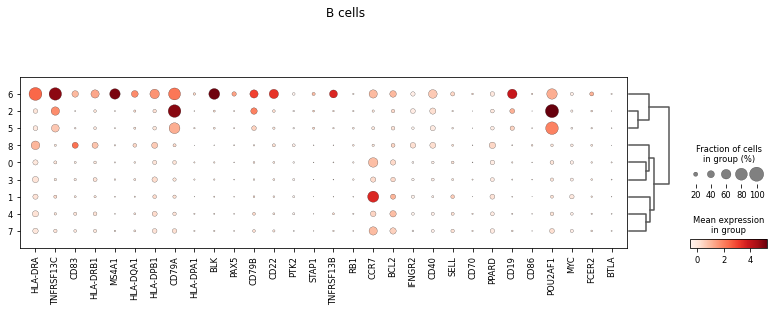

Cytotoxic T cells


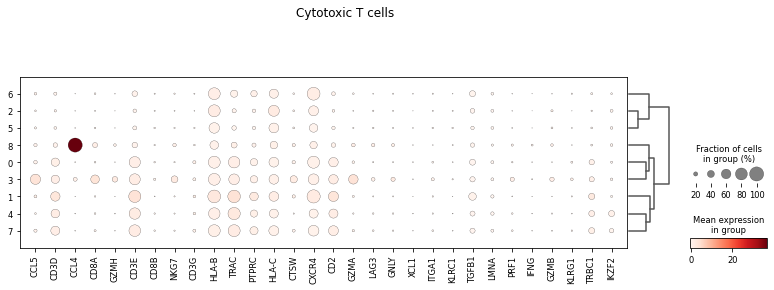

Innate lymphoid cells A


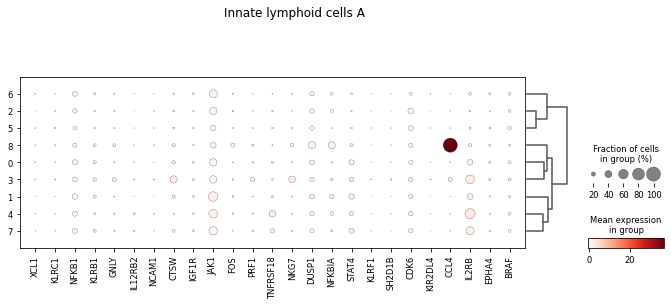

Innate lymphoid cells B


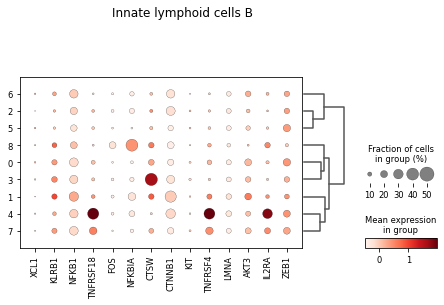

Natural killer cells


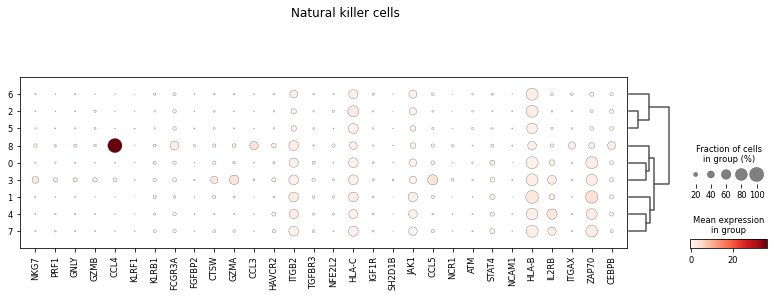

Plasma B cells


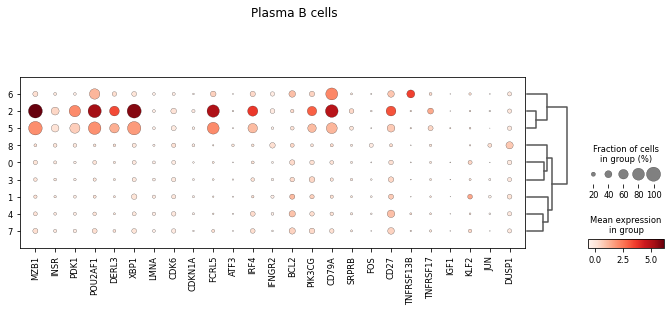

Regulatory T cells


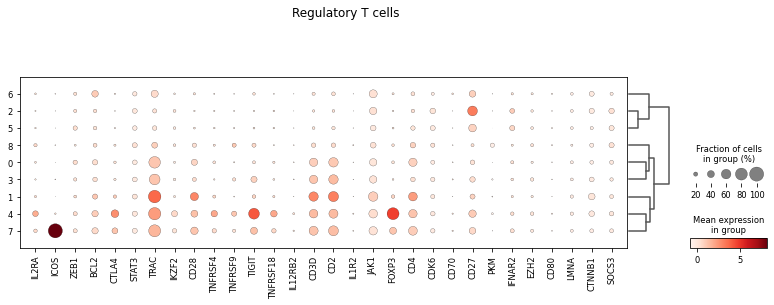

T cells


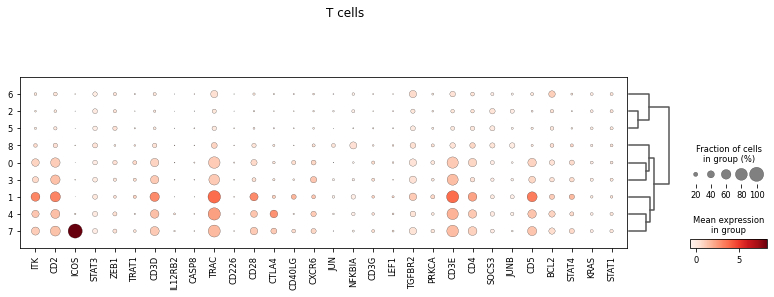

In [151]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers_3):
    print(celltype)
    sc.pl.dotplot(sp_adata_3, markers_3[celltype], groupby='leiden', dendrogram=True, title=celltype)

In [152]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# B cells
# Plasma B cells
# Natural killer cells
# Innate lymphoid cells A
# Innate lymphoid cells B
# T cells
# Cytotoxic T cells
# Regulatory T cells

num_leiden = len(set(sp_adata_3.obs['leiden']))
clusters2types = {k: 'Lymphoid' for k in range(0, num_leiden)}

assigned_clusters = {
    'B cells': ['6'],
    'Plasma B cells': ['2','5'],
    'T cells, natural killer cells, innate lymphoid cells A, B': ['8','0','3','1','4','7']
}

for k1, v1 in clusters2types.items():
    for k2, v2 in assigned_clusters.items():
        for i in v2:
            clusters2types[int(i)] = k2

sp_adata_3.obs['cell_type_manual_minor'] = [clusters2types[int(cluster)] for cluster in sp_adata_3.obs['leiden']]
types = list(set(sp_adata_3.obs['cell_type_manual_minor']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata_3.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata_3.obs['cell_type_manual_minor']]

clusters2types

{0: 'T cells, natural killer cells, innate lymphoid cells A, B',
 1: 'T cells, natural killer cells, innate lymphoid cells A, B',
 2: 'Plasma B cells',
 3: 'T cells, natural killer cells, innate lymphoid cells A, B',
 4: 'T cells, natural killer cells, innate lymphoid cells A, B',
 5: 'Plasma B cells',
 6: 'B cells',
 7: 'T cells, natural killer cells, innate lymphoid cells A, B',
 8: 'T cells, natural killer cells, innate lymphoid cells A, B'}

In [153]:
Counter(sp_adata_3.obs['cell_type_manual_minor'])

Counter({'T cells, natural killer cells, innate lymphoid cells A, B': 22040,
         'Plasma B cells': 7507,
         'B cells': 2279})

## Plot annotated results

[[0.59774828 0.87652117 0.38527416]
 [0.0951214  0.96880974 0.7847031 ]
 [0.75529008 0.83166292 0.08099827]]


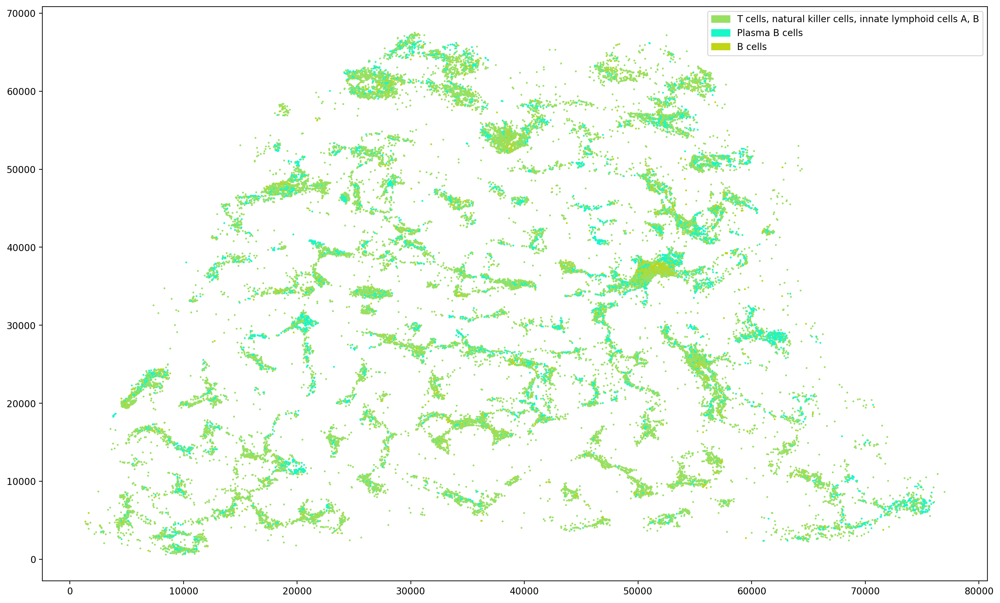

In [154]:
fig = plt.figure(figsize=(15, 9), constrained_layout=True, dpi=200)
color_tups = np.random.rand(np.max(sp_adata_3.obs['int_type'])+1,3)
print(color_tups)

handles = []
for int_type in set(sp_adata_3.obs['int_type']):
    handles.append(mpatches.Patch(color=color_tups[int_type], label=types[int_type]))
    

plt.scatter(sp_adata_3.obs["x"], 
              sp_adata_3.obs["y"],
              c=sp_adata_3.obs['int_type'], 
              cmap=matplotlib.colors.ListedColormap(color_tups),
              s=1, alpha=1.0)

plt.legend(handles=handles)

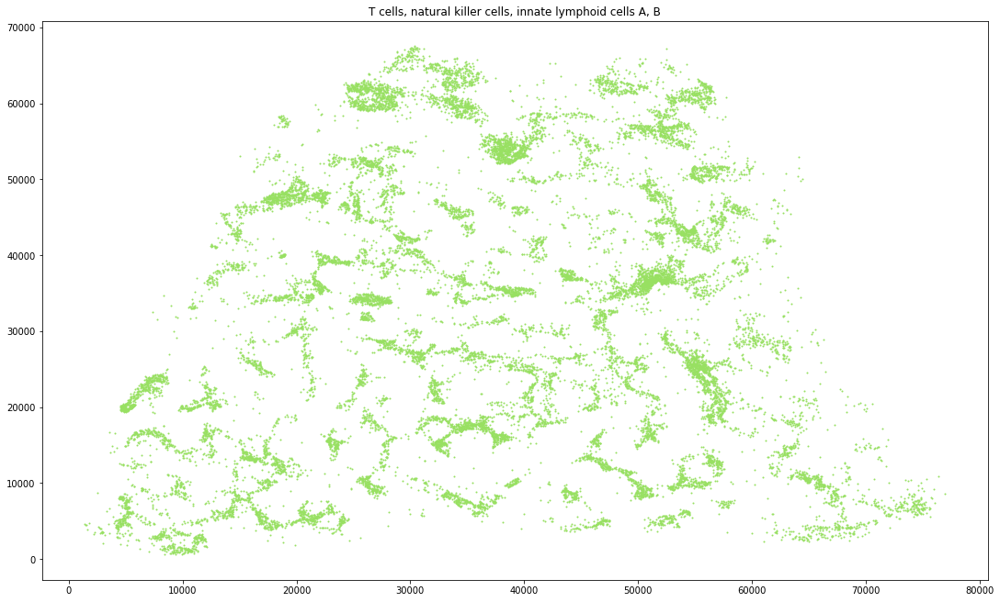

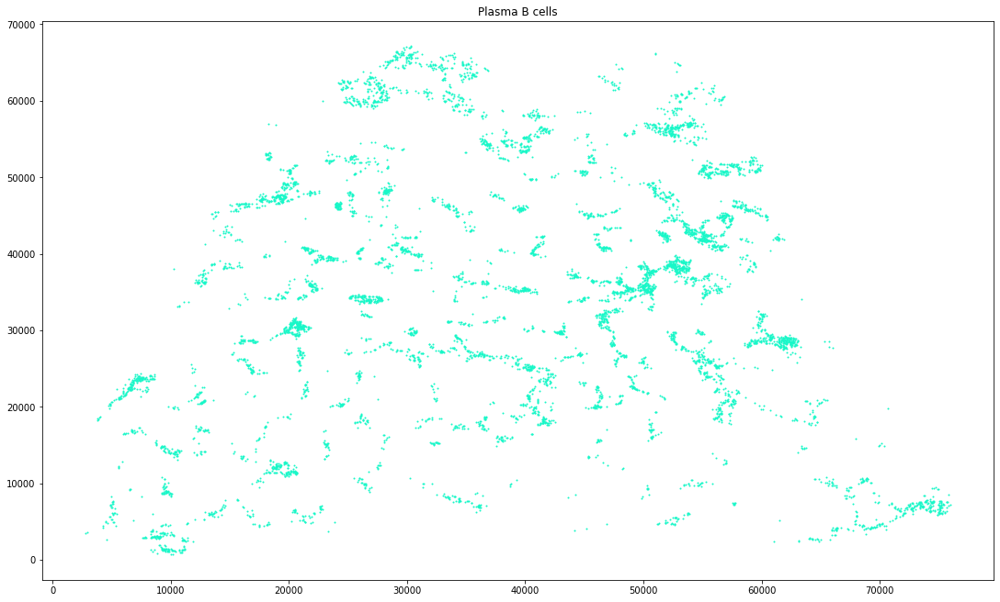

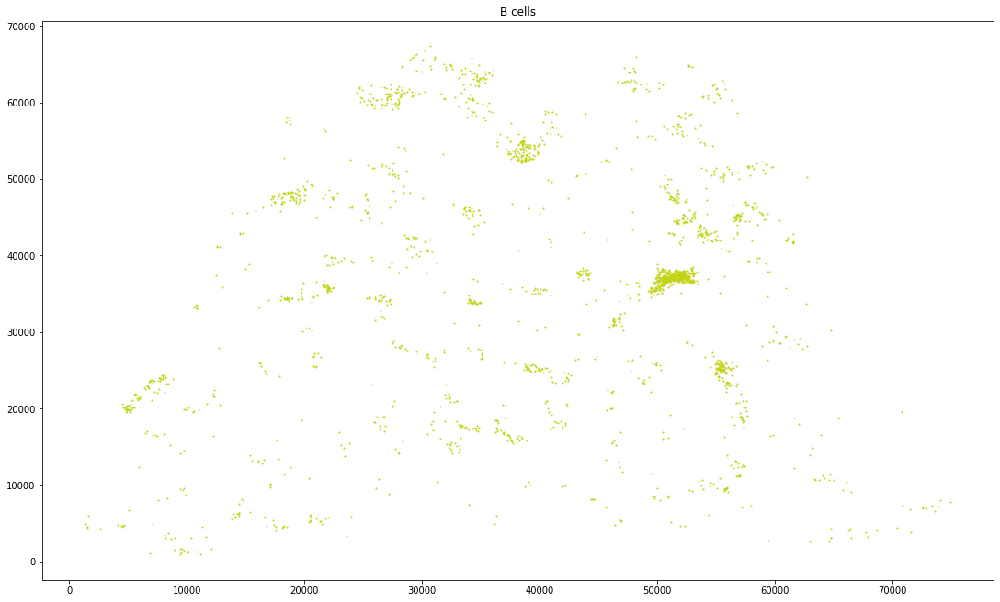

In [155]:
types = list(set(sp_adata_3.obs['cell_type_manual_minor']))
for cell_type in types:
    
    type_adata = sp_adata_3[sp_adata_3.obs['cell_type_manual_minor'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

### Myeloid

In [156]:
# Already ran permutation functions to find the best PC, neighbors and resolution
# n_pcs = 6
# n_neighbors = 10
# res = 2.5
n_pcs = 10
n_neighbors = 10
res = 0.4

# PCA
sc.tl.pca(sp_adata_4, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata_4, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata_4)

# Leiden clustering
sc.tl.leiden(sp_adata_4, resolution=res)

n_pcs = 10, n_neighbors = 10, resolution = 0.4


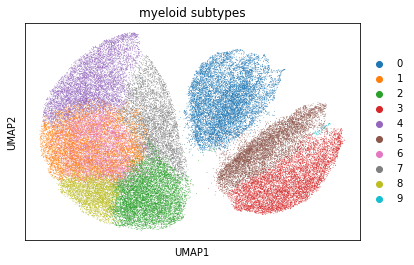

In [157]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata_4, color=['leiden'],
                        cmap='tab20',
                        title='myeloid subtypes'
                        )

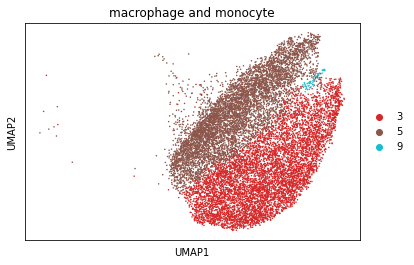

In [158]:
macrophage_monocyte = sp_adata_4[np.isin(sp_adata_4.obs['leiden'], ['9','3','5'])] 
sc.pl.umap(macrophage_monocyte, color=['leiden'],
                        cmap='tab20',
                        title='macrophage and monocyte'
                            )

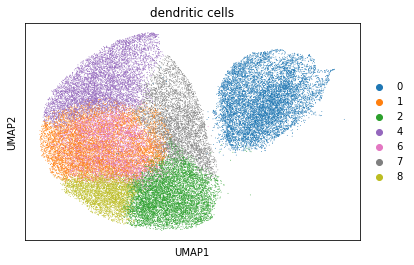

In [159]:
dendritic = sp_adata_4[np.isin(sp_adata_4.obs['leiden'], ['7','6','1','4','0','2','8'])] 
sc.pl.umap(dendritic, color=['leiden'],
                        cmap='tab20',
                        title='dendritic cells'
                            )

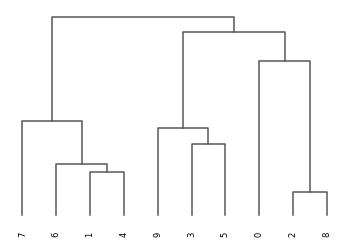

<AxesSubplot:>

In [160]:
sc.tl.dendrogram(sp_adata_4, 'leiden')
sc.pl.dendrogram(sp_adata_4, 'leiden')

Alveolar macrophage cells


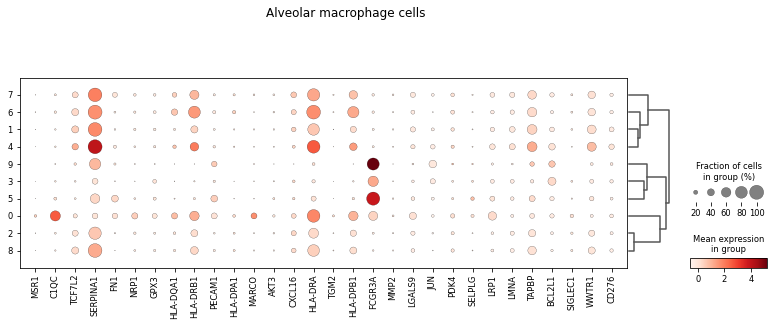

Classical monocyte


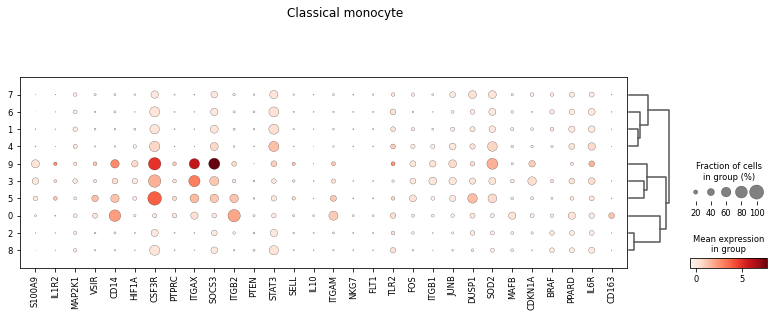

Conventional type 1 dendritic cells


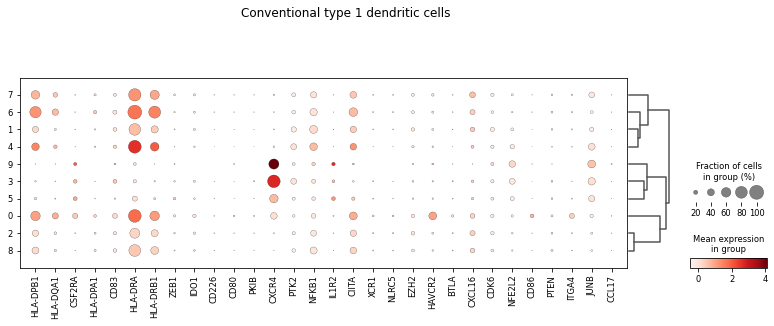

Conventional type 2 dendritic cells


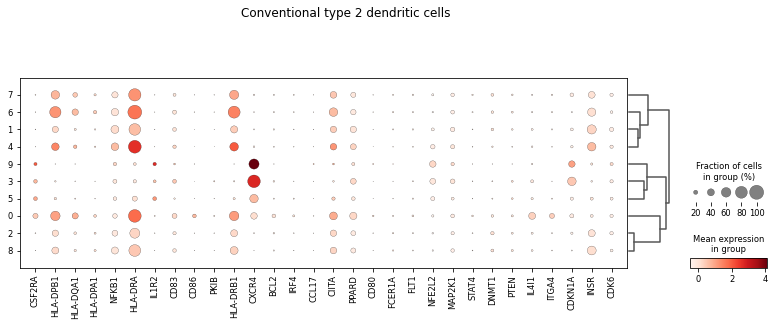

Langerhans dendritic cells


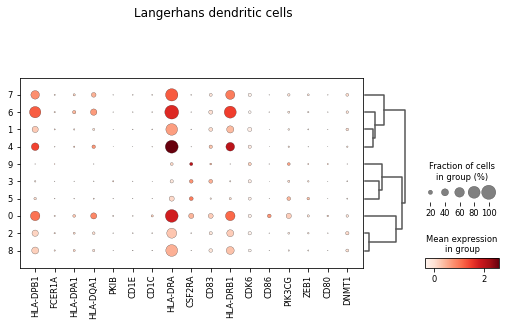

Macrophage


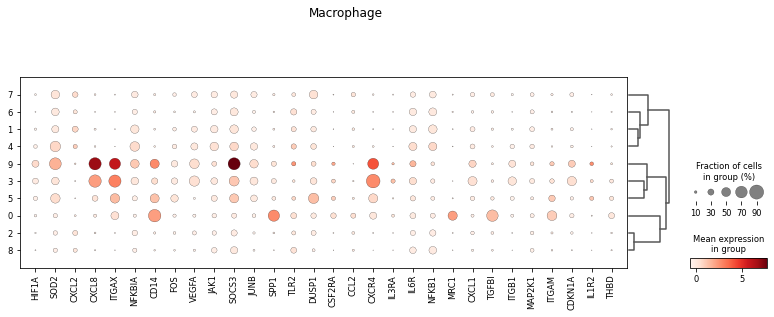

Mast


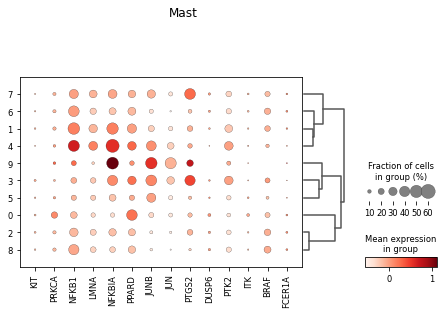

Mature dendritic cells


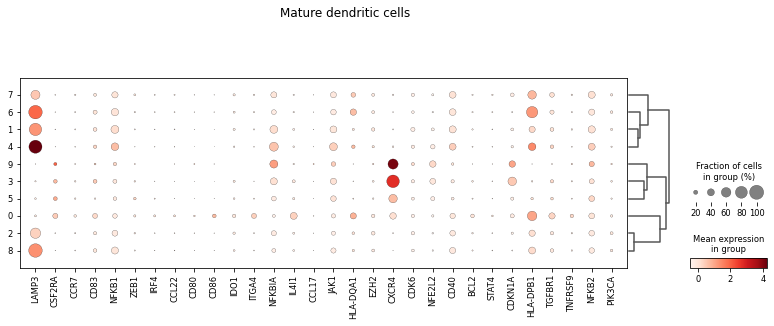

Nonclassical monocyte


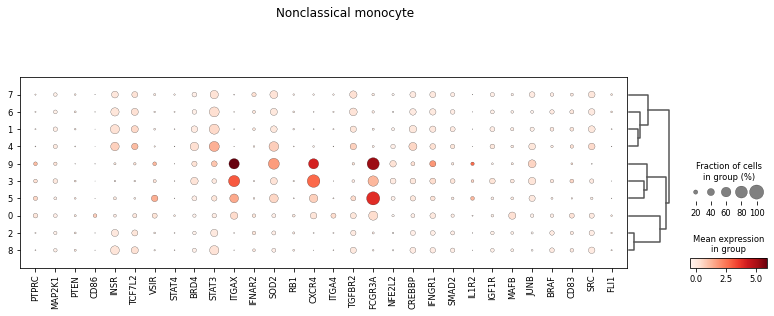

Plasmacytoid dendritic cells


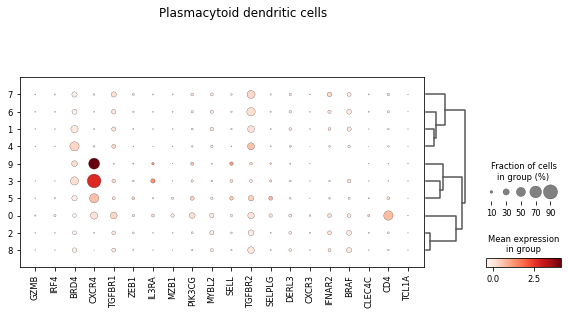

In [161]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers_4):
    print(celltype)
    sc.pl.dotplot(sp_adata_4, markers_4[celltype], groupby='leiden', dendrogram=True, title=celltype)

In [162]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# Macrophage
# Alveolar macrophage cells
# Conventional type 1 dendritic cells
# Conventional type 2 dendritic cells
# Langerhans dendritic cells
# Mature dendritic cells
# Plasmacytoid dendritic cells
# Mast
# Classical monocyte
# Nonclassical monocyte

num_leiden = len(set(sp_adata_4.obs['leiden']))
clusters2types = {k: 'Myeloid' for k in range(0, num_leiden)}

assigned_clusters = {
    'Macrophage and monocytes': ['9','3','5'],
    'Dendritic cells': ['7','6','1','4','0','2','8']
}

for k1, v1 in clusters2types.items():
    for k2, v2 in assigned_clusters.items():
        for i in v2:
            clusters2types[int(i)] = k2

sp_adata_4.obs['cell_type_manual_minor'] = [clusters2types[int(cluster)] for cluster in sp_adata_4.obs['leiden']]
types = list(set(sp_adata_4.obs['cell_type_manual_minor']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata_4.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata_4.obs['cell_type_manual_minor']]

clusters2types

{0: 'Dendritic cells',
 1: 'Dendritic cells',
 2: 'Dendritic cells',
 3: 'Macrophage and monocytes',
 4: 'Dendritic cells',
 5: 'Macrophage and monocytes',
 6: 'Dendritic cells',
 7: 'Dendritic cells',
 8: 'Dendritic cells',
 9: 'Macrophage and monocytes'}

In [163]:
Counter(sp_adata_4.obs['cell_type_manual_minor'])

Counter({'Macrophage and monocytes': 13125, 'Dendritic cells': 43113})

## Plot annotated results

[[0.91430692 0.75616568 0.6605054 ]
 [0.80366044 0.99160566 0.5767392 ]]


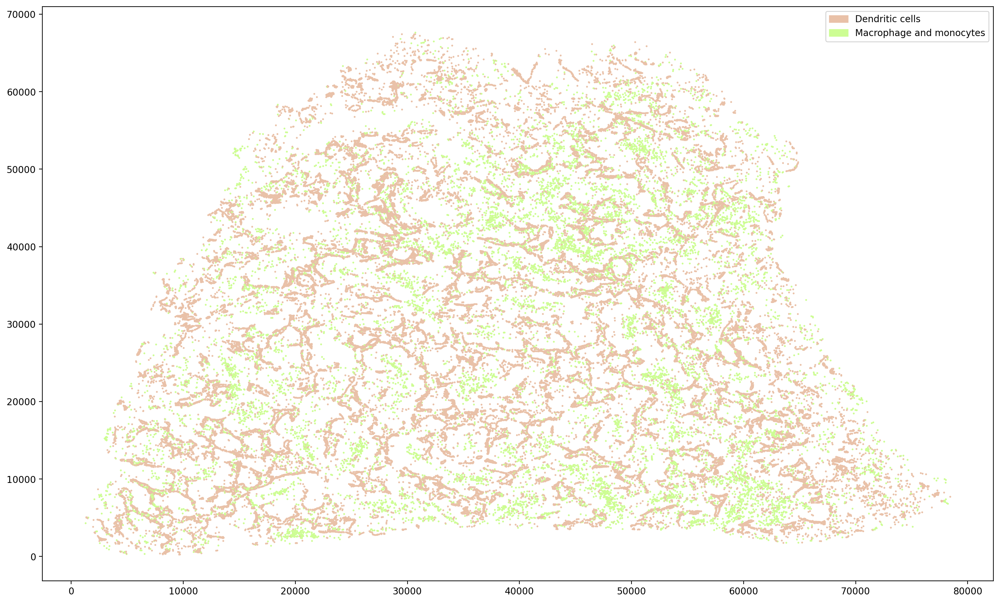

In [164]:
fig = plt.figure(figsize=(15, 9), constrained_layout=True, dpi=200)
color_tups = np.random.rand(np.max(sp_adata_4.obs['int_type'])+1,3)
print(color_tups)

handles = []
for int_type in set(sp_adata_4.obs['int_type']):
    handles.append(mpatches.Patch(color=color_tups[int_type], label=types[int_type]))
    

plt.scatter(sp_adata_4.obs["x"], 
              sp_adata_4.obs["y"],
              c=sp_adata_4.obs['int_type'], 
              cmap=matplotlib.colors.ListedColormap(color_tups),
              s=1, alpha=1.0)

plt.legend(handles=handles)

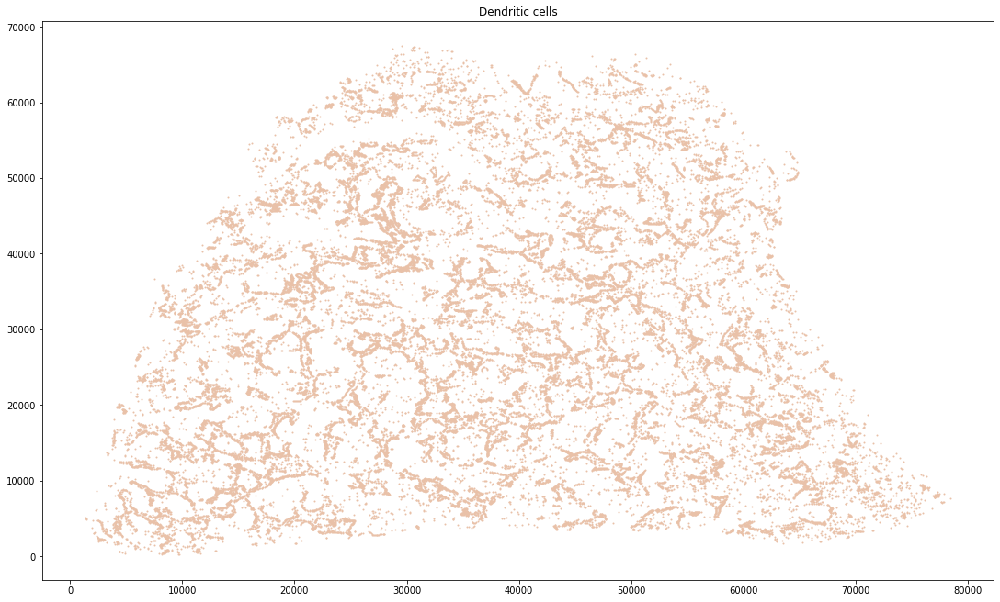

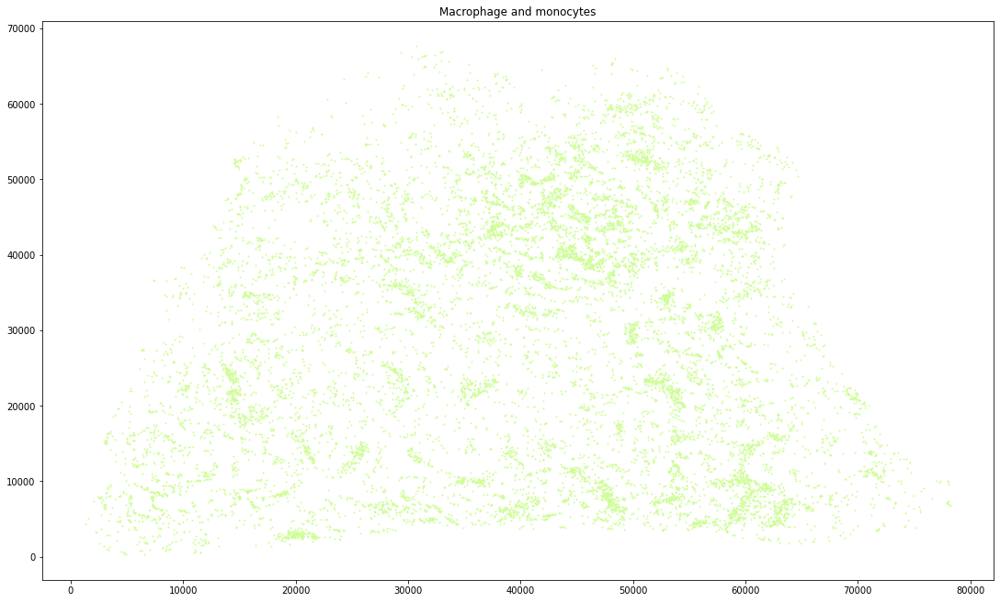

In [165]:
types = list(set(sp_adata_4.obs['cell_type_manual_minor']))
for cell_type in types:
    
    type_adata = sp_adata_4[sp_adata_4.obs['cell_type_manual_minor'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

### Stromal

In [166]:
# Already ran permutation functions to find the best PC, neighbors and resolution
# n_pcs = 2
# n_neighbors = 5
# res = 3

n_pcs = 20
n_neighbors = 40
res = 0.2

# PCA
sc.tl.pca(sp_adata_5, svd_solver='arpack', n_comps=n_pcs)

# Compute neightborhood graph
sc.pp.neighbors(sp_adata_5, n_neighbors=n_neighbors, n_pcs=n_pcs)

# Calculate umap representation
sc.tl.umap(sp_adata_5)

# Leiden clustering
sc.tl.leiden(sp_adata_5, resolution=res)

n_pcs = 20, n_neighbors = 40, resolution = 0.2


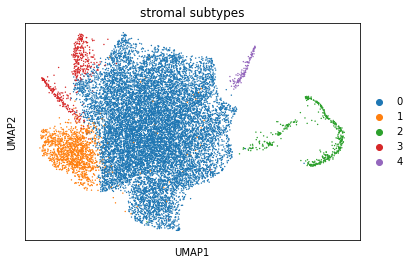

In [167]:
print(f'n_pcs = {n_pcs}, n_neighbors = {n_neighbors}, resolution = {res}')
sc.pl.umap(sp_adata_5, color=['leiden'],
                        cmap='tab20',
                        title='stromal subtypes',  
#                         palette=list(matplotlib.colors.CSS4_COLORS.values())
                            )

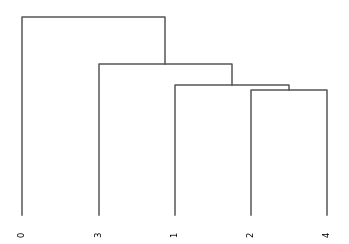

<AxesSubplot:>

In [168]:
sc.tl.dendrogram(sp_adata_5, 'leiden')
sc.pl.dendrogram(sp_adata_5, 'leiden')

Fibroblast


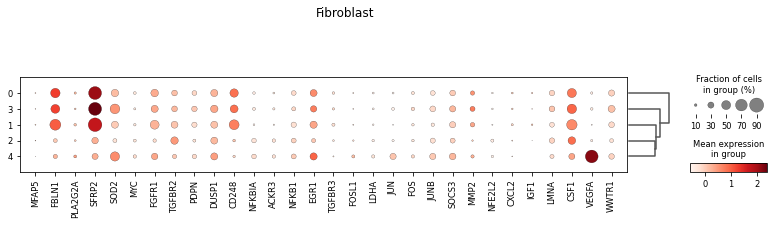

Myofibroblast


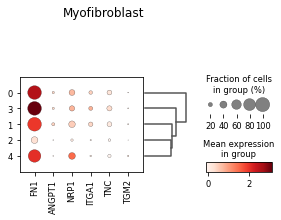

Pericyte


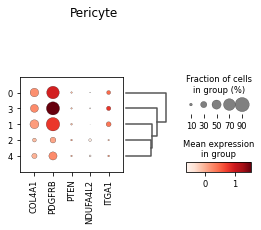

Smooth muscle cells


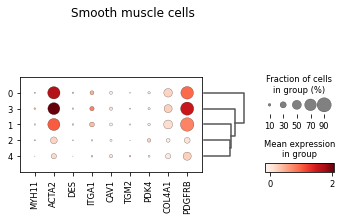

In [169]:
# Create dot plot of expression values of each major cell type
for celltype in sorted(markers_5):
    print(celltype)
    sc.pl.dotplot(sp_adata_5, markers_5[celltype], groupby='leiden', dendrogram=True, title=celltype)

In [170]:
# Here we manually assign cluster labels to the cell type determined by manual inspection.
# Any cluster that doesn't have a matching cell type you can just label as "Unassigned". These could be cell
# types that just aren't in the scRNAseq data so we aren't testing for them, or they could simply be low quality
# cells that somehow got past our filters and clustered together.
# Fibroblast
# Myofibroblast
# Pericyte
# Smooth muscle cells

num_leiden = len(set(sp_adata_5.obs['leiden']))
clusters2types = {k: 'Stromal' for k in range(0, num_leiden)}

# assigned_clusters = {
#     'Fibroblast': [],
#     'Myofibroblast': [],
#     'Pericyte': [],
#     'Smooth muscle cells': []
# }

# for k1, v1 in clusters2types.items():
#     for k2, v2 in assigned_clusters.items():
#         for i in v2:
#             clusters2types[int(i)] = k2

sp_adata_5.obs['cell_type_manual_minor'] = [clusters2types[int(cluster)] for cluster in sp_adata_5.obs['leiden']]
types = list(set(sp_adata_5.obs['cell_type_manual_minor']))
type2int = {cell_type: x for x, cell_type in enumerate(types)}
sp_adata_5.obs['int_type'] = [type2int[cell_type] for cell_type in sp_adata_5.obs['cell_type_manual_minor']]

clusters2types

{0: 'Stromal', 1: 'Stromal', 2: 'Stromal', 3: 'Stromal', 4: 'Stromal'}

In [226]:
Counter(sp_adata_5.obs['cell_type_manual_minor'])

Counter({'Stromal': 14963})

## Plot annotated results

[[0.85499333 0.2537792  0.46005359]]


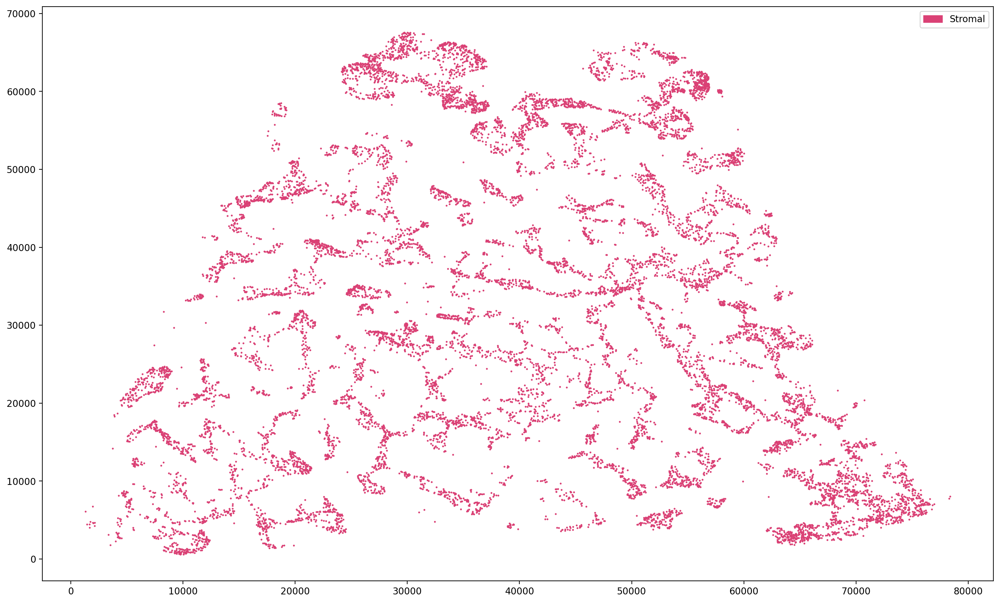

In [171]:
fig = plt.figure(figsize=(15, 9), constrained_layout=True, dpi=200)
color_tups = np.random.rand(np.max(sp_adata_5.obs['int_type'])+1,3)
print(color_tups)

handles = []
for int_type in set(sp_adata_5.obs['int_type']):
    handles.append(mpatches.Patch(color=color_tups[int_type], label=types[int_type]))
    

plt.scatter(sp_adata_5.obs["x"], 
              sp_adata_5.obs["y"],
              c=sp_adata_5.obs['int_type'], 
              cmap=matplotlib.colors.ListedColormap(color_tups),
              s=1, alpha=1.0)

plt.legend(handles=handles)

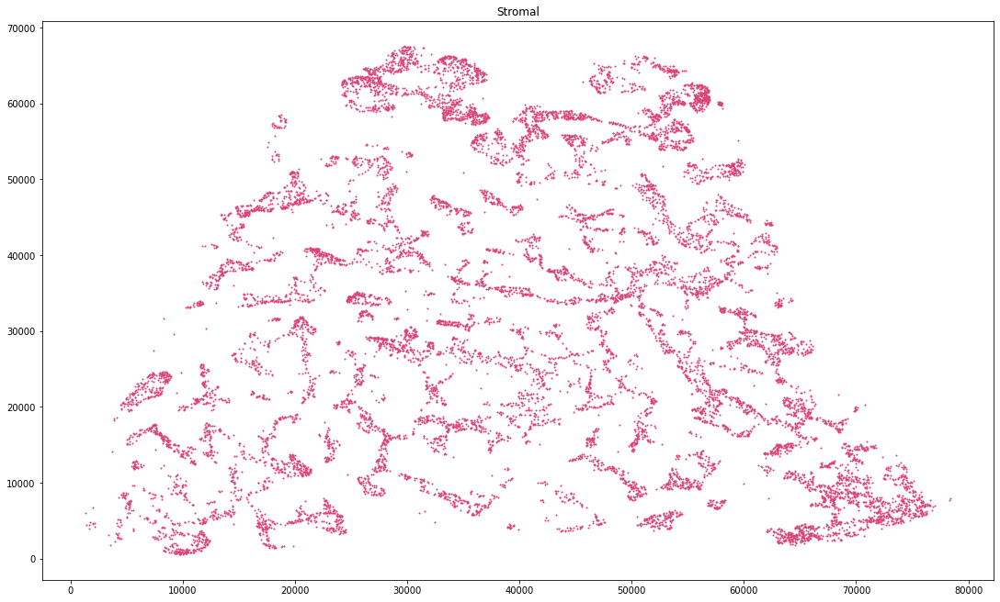

In [172]:
types = list(set(sp_adata_5.obs['cell_type_manual_minor']))
for cell_type in types:
    
    type_adata = sp_adata_5[sp_adata_5.obs['cell_type_manual_minor'] == cell_type]
    
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)

    plt.scatter(type_adata.obs["x"], 
                  type_adata.obs["y"],
                  color=color_tups[type_adata.obs['int_type'][0]], 
                  s=1, alpha=1.0)


    plt.title(cell_type)
    plt.show()

In [196]:
# # Combine annotated subsets
# sp_adata = ad.concat([sp_adata_1, sp_adata_2, sp_adata_3, sp_adata_4, sp_adata_5], axis=0, join='outer')
# sp_adata.obs = sp_adata.obs.sort_index()
# sp_adata.var['gene'] = sp_adata.var.index

In [174]:
# Save annoted cell types for further classification (cancer vs non-cancer)
sp_adata.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata.h5ad')
sp_adata_1.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata_1.h5ad')
sp_adata_2.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata_2.h5ad')
sp_adata_3.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata_3.h5ad')
sp_adata_4.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata_4.h5ad')
sp_adata_5.write(f'/mnt/uydnguye/predict_celltype_lung_cancer/annotated_merfish/sp_adata_5.h5ad')